载入 47 个有效观测源。

>>> 启动并行 MCMC (200 核心) - 10参数(Pb_ms)版本...
[进度] 2.5% (50/2000) | Acc: 0.44 | ETA: 2276.4 min
[进度] 5.0% (100/2000) | Acc: 0.50 | ETA: 1388.2 min
[进度] 7.5% (150/2000) | Acc: 0.49 | ETA: 961.9 min
[进度] 10.0% (200/2000) | Acc: 0.49 | ETA: 759.8 min
[进度] 12.5% (250/2000) | Acc: 0.51 | ETA: 666.2 min
[进度] 15.0% (300/2000) | Acc: 0.52 | ETA: 628.3 min
[进度] 17.5% (350/2000) | Acc: 0.50 | ETA: 556.1 min
[进度] 20.0% (400/2000) | Acc: 0.48 | ETA: 503.2 min
[进度] 22.5% (450/2000) | Acc: 0.46 | ETA: 531.1 min
[进度] 25.0% (500/2000) | Acc: 0.46 | ETA: 495.0 min
[进度] 27.5% (550/2000) | Acc: 0.47 | ETA: 485.4 min
[进度] 30.0% (600/2000) | Acc: 0.47 | ETA: 489.9 min
[进度] 32.5% (650/2000) | Acc: 0.47 | ETA: 462.9 min
[进度] 35.0% (700/2000) | Acc: 0.46 | ETA: 472.9 min
[进度] 37.5% (750/2000) | Acc: 0.46 | ETA: 432.8 min
[进度] 40.0% (800/2000) | Acc: 0.46 | ETA: 397.7 min
[进度] 42.5% (850/2000) | Acc: 0.45 | ETA: 366.6 min
[进度] 45.0% (900/2000) | Acc: 0.46 | ETA: 337.5 min
[进度] 47.5% (950/2000) | Acc

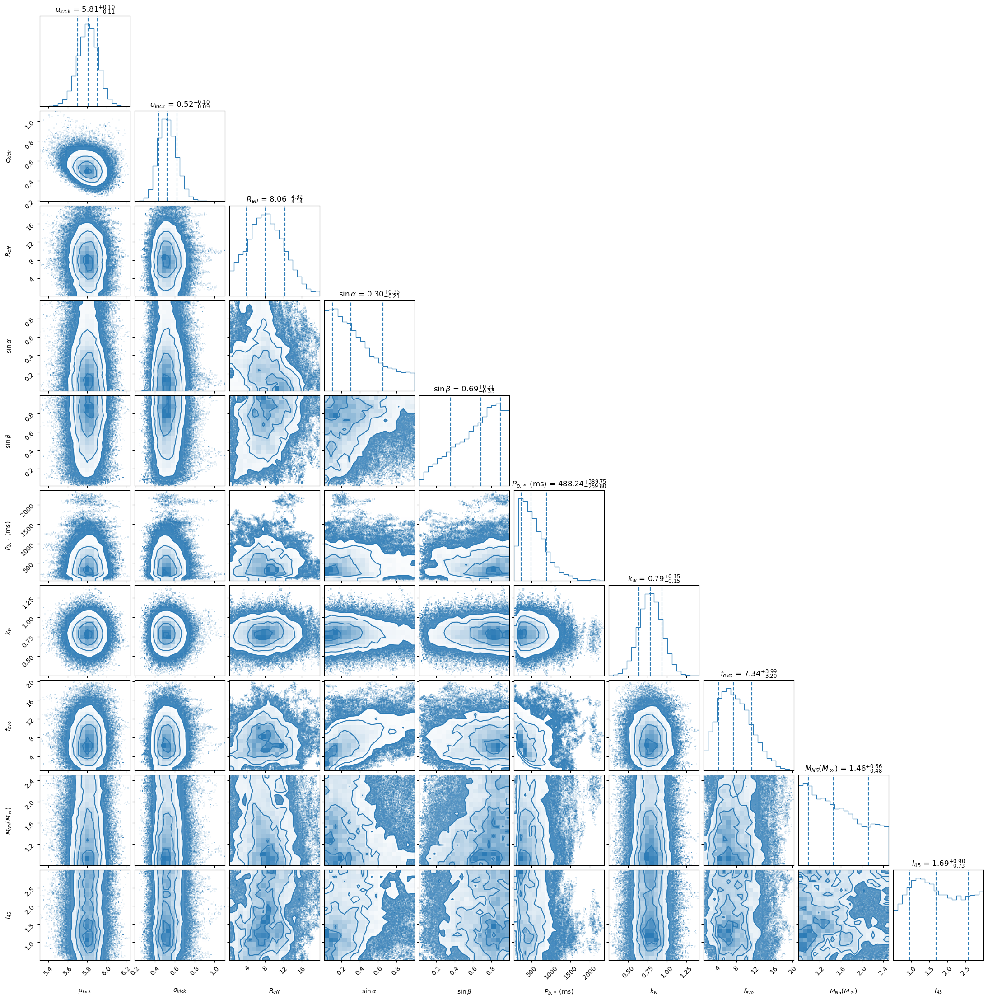

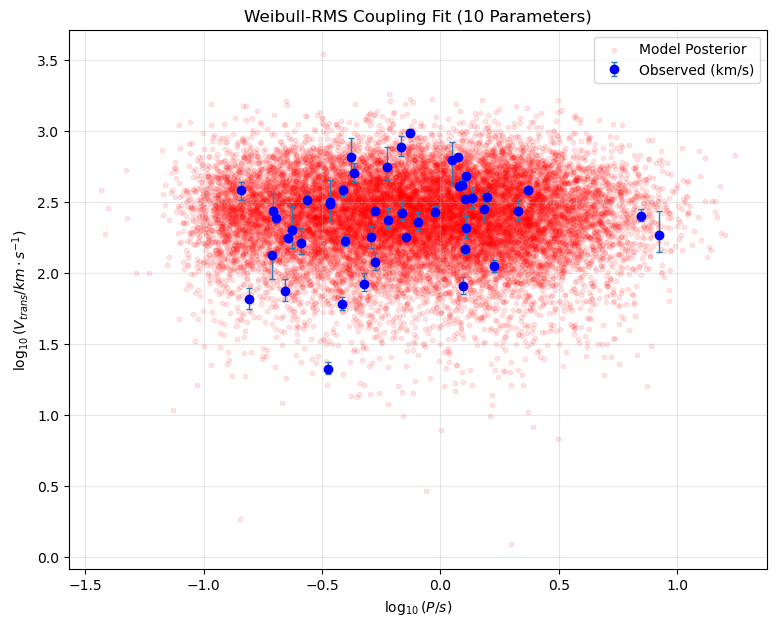

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde, lognorm, weibull_min, norm
from scipy.special import logsumexp, gamma
import time
import multiprocessing as mp 
import sys

# 尝试导入 corner
try:
    import corner
except ImportError:
    corner = None

# ==========================================
# 1. 物理模型：10参数 (Pb_* 版本 + Sigmoid 平滑)
# ==========================================
def simulate_full_population(N_sim, theta):
    """
    theta 参数列表 (10个):
    0. mu_log: Kick速度 Log-Normal 的 mu
    1. sigma_log: Kick速度 Log-Normal 的 sigma
    2. R_eff_km: 有效半径 (km)
    3. sin_alpha: 几何因子 alpha 的正弦值
    4. sin_beta: 几何因子 beta 的正弦值
    5. P_b_star_ms: [修改] 基础自旋周期 P_b,* (单位 ms)
    6. k_weibull: Weibull 分布形状参数 k
    7. f_evo: 周期演化因子 <1/(1-tau)>
    8. M_sol: [变量] 中子星质量 (太阳质量)
    9. I_45:  [变量] 转动惯量 (10^45 g cm^2)
    """
    try:
        # [修改] 解包 10 个参数，注意第 6 个是 P_b_star_ms
        mu_log, sigma_log, R_eff_km, sin_alpha, sin_beta, P_b_star_ms, k_w, f_evo, M_sol, I_45 = theta
    except ValueError:
        return np.array([]), np.array([])

    # [变量] 物理常数计算
    M_ns = M_sol * 1.989e33   # g
    I_ns = I_45 * 1e45        # g cm^2
    
    # [关键修改] 将 P_b (ms) 转换为 S_b (cgs) 用于后续 RMS 计算
    # P_b (ms) -> P_b (s)
    P_b_s = P_b_star_ms * 1e-3
    # S = 2 * pi * I / P
    S_b_star = (2 * np.pi * I_ns) / P_b_s

    # 1. Kick (km/s -> cm/s)
    v_3d_kms = lognorm.rvs(s=sigma_log, scale=np.exp(mu_log), size=N_sim) 
    v_3d_cgs = v_3d_kms * 1e5 
    
    u = np.random.uniform(-1, 1, N_sim)
    sin_proj = np.sqrt(1 - u**2)
    v_trans = v_3d_cgs * sin_proj

    # 2. RMS Coupling
    R_cgs = R_eff_km * 1e5
    delta_S_dist = (M_ns * R_cgs * sin_alpha * v_trans) / (sin_beta + 1e-10)
    delta_S_sq_mean = np.mean(delta_S_dist**2)
    
    # 这里使用的是刚刚换算得到的 S_b_star
    S0_rms_val = np.sqrt(S_b_star**2 + delta_S_sq_mean)
    
    P0_rms = (2 * np.pi * I_ns) / S0_rms_val

    # 3. Weibull
    gamma_factor = np.sqrt(gamma(1 + 2.0/k_w))
    lambda_w = P0_rms / gamma_factor
    P_birth = weibull_min.rvs(c=k_w, scale=lambda_w, size=N_sim)

    # 4. Evolution & Sigmoid Selection (保留平滑)
    P_obs = P_birth * f_evo
    
    p_detect = 1.0 / (1.0 + np.exp(-(P_obs - 0.1) / 0.01))
    random_roll = np.random.rand(N_sim)
    
    mask = (random_roll < p_detect) & (P_obs < 100) & (v_trans > 0)
    
    return np.log10(P_obs[mask]), np.log10(v_trans[mask])

# ==========================================
# 2. 似然函数
# ==========================================
def log_prior(theta):
    if len(theta) != 10: return -np.inf
    # [修改] 解包 Pb_ms
    mu, sig, R, sa, sb, Pb_ms, k, f, M_sol, I_45 = theta

    if not (4.0 < mu < 7.5): return -np.inf      
    if not (0.1 < sig < 2.0): return -np.inf     
    if not (0.1 < R < 20.0): return -np.inf      
    if not (0.01 < sa < 1.0): return -np.inf     
    if not (0.01 < sb < 1.0): return -np.inf     
    
    # [修改] Pb_ms 的先验范围 (10ms - 5000ms)
    if not (10.0 < Pb_ms < 5000.0): return -np.inf 
    
    if not (0.1 < k < 5.0): return -np.inf       
    if not (1.0 < f < 50.0): return -np.inf      

    if not (0.8 < M_sol < 2.5): return -np.inf 
    if not (0.5 < I_45 < 3.0): return -np.inf 

    return 0.0 

def log_likelihood(theta, obs_data):
    lp = log_prior(theta)
    if not np.isfinite(lp): return -np.inf
    try:
        sim_logP, sim_logV = simulate_full_population(5000, theta)
    except: return -np.inf
    if len(sim_logP) < 50: return -np.inf
    try:
        values = np.vstack([sim_logP, sim_logV])
        kernel = gaussian_kde(values, bw_method='scott') 
        obs_P_mat, obs_V_mat = obs_data
        n_obs, n_samples = obs_P_mat.shape
        check_points = np.vstack([obs_P_mat.ravel(), obs_V_mat.ravel()])
        log_pdf_all = kernel.logpdf(check_points)
        log_pdf_all = np.maximum(log_pdf_all, -100.0)
        log_pdf_mat = log_pdf_all.reshape(n_obs, n_samples)
        log_likelihood_per_star = logsumexp(log_pdf_mat, axis=1) - np.log(n_samples)
        return np.sum(log_likelihood_per_star) + lp 
    except: return -np.inf

# ==========================================
# 3. 单链 MCMC
# ==========================================
def run_single_chain(args):
    seed, start_theta, n_steps, obs_data, is_representative = args
    np.random.seed(seed) 
    ndim = len(start_theta)
    current_theta = np.array(start_theta) * (1 + np.random.normal(0, 0.01, ndim))
    current_lp = log_likelihood(current_theta, obs_data)
    if current_lp == -np.inf:
        current_theta = np.array(start_theta)
        current_lp = log_likelihood(current_theta, obs_data)

    chain = []
    accepted = 0
    # [修改] 步长设置: 
    # Index 5 (Pb_ms) 设为 20.0，其余保持合适比例
    step_scale = np.array([0.05, 0.03, 0.2, 0.02, 0.02, 20.0, 0.05, 0.2, 0.05, 0.05]) 
    
    start_time = time.time()
    for i in range(n_steps):
        proposal = current_theta + np.random.normal(0, 1, ndim) * step_scale
        proposal_lp = log_likelihood(proposal, obs_data)
        if proposal_lp > -np.inf:
            if current_lp == -np.inf: ratio = 1.0
            else: ratio = np.exp(proposal_lp - current_lp)
            if np.random.rand() < ratio:
                current_theta = proposal
                current_lp = proposal_lp
                accepted += 1
        chain.append(current_theta)
        if is_representative and (i + 1) % 50 == 0:
            elapsed = time.time() - start_time
            steps_done = i + 1
            avg_time = elapsed / steps_done
            remain = (n_steps - steps_done) * avg_time
            print(f"[进度] {steps_done/n_steps*100:.1f}% ({steps_done}/{n_steps}) | Acc: {accepted/steps_done:.2f} | ETA: {remain/60:.1f} min")
            sys.stdout.flush()
    return np.array(chain), accepted / n_steps

# ==========================================
# 4. 主程序
# ==========================================
if __name__ == "__main__":
    # --- 数据导入 (请确保路径正确) ---
    base_path = '/home/lz/work/pulsar_kick_period/' 
    try:
        raw_velocities = np.loadtxt(base_path + 'vtrans_49_data.txt')
        raw_periods = np.loadtxt(base_path + 'period_49_data.txt')
        raw_v_err_low = np.loadtxt(base_path + 'v_err_low_49_data.txt')
        raw_v_err_up = np.loadtxt(base_path + 'v_err_up_49_data.txt') 
    except Exception as e:
        print(f"数据加载失败: {e}")
        sys.exit(1)

    mask_period = raw_periods > 0.1 
    mask_velocity = (raw_velocities <= 1000.0) & (raw_velocities > 10.0)
    final_mask = mask_period & mask_velocity
    clean_periods = raw_periods[final_mask]
    clean_velocities = raw_velocities[final_mask]
    clean_err_low = raw_v_err_low[final_mask]
    clean_err_up = raw_v_err_up[final_mask]
    n_obs = len(clean_periods)
    print(f"载入 {n_obs} 个有效观测源。")

    # --- 生成误差云 ---
    N_samples_per_obs = 100 
    obs_velocity_samples = np.zeros((n_obs, N_samples_per_obs))
    np.random.seed(42)
    for i in range(n_obs):
        v_mode = clean_velocities[i]
        sig_low = clean_err_low[i]
        sig_up = clean_err_up[i]
        z = np.random.normal(0, 1, N_samples_per_obs)
        noise = np.where(z < 0, z * sig_low, z * sig_up)
        v_cloud = np.abs(v_mode + noise)
        obs_velocity_samples[i, :] = v_cloud

    obs_logV_cloud = np.log10(obs_velocity_samples * 1e5) 
    obs_logP_cloud = np.tile(np.log10(clean_periods)[:, np.newaxis], (1, N_samples_per_obs))
    obs_data = (obs_logP_cloud, obs_logV_cloud)

    # --- 并行 MCMC ---
    n_cores = 200
    try:
        max_cpu = mp.cpu_count()
        if n_cores > max_cpu: n_cores = max_cpu
    except: pass
        
    print(f"\n>>> 启动并行 MCMC ({n_cores} 核心) - 10参数(Pb_ms)版本...")
    
    steps_per_chain = 2000 
    # [修改] 初始猜测 (10参数)
    # Pb_ms = 400.0
    init_guess = [5.5, 0.5, 10.0, 0.5, 0.5, 400.0, 1.0, 5.0, 1.4, 1.0]
    
    seeds = [1000 + i for i in range(n_cores)]
    tasks = []
    for i, seed in enumerate(seeds):
        is_representative = (i == 0)
        tasks.append((seed, init_guess, steps_per_chain, obs_data, is_representative))
    
    start_time = time.time()
    results = []
    with mp.Pool(processes=n_cores) as pool:
        iterator = pool.imap_unordered(run_single_chain, tasks)
        for result in iterator:
            results.append(result)
    print(f"\n>>> 计算完成! 耗时: {time.time() - start_time:.1f} s")
    
    # --- 绘图 ---
    all_chains = []
    acc_rates = []
    for chain, acc in results:
        burn_in = int(steps_per_chain * 0.3)
        if len(chain) > burn_in:
            all_chains.append(chain[burn_in:])
        acc_rates.append(acc)

    print(f"平均接受率: {np.mean(acc_rates):.2f}")     
    combined_samples = np.vstack(all_chains)
    best_theta = np.median(combined_samples, axis=0)
    
    # [修改] 标签更新
    labels = [
        r"$\mu_{kick}$", r"$\sigma_{kick}$", r"$R_{eff}$", 
        r"$\sin\alpha$", r"$\sin\beta$", r"$P_{b,*}$ (ms)", 
        r"$k_{w}$", r"$f_{evo}$",
        r"$M_{NS} (M_\odot)$", r"$I_{45}$"
    ]
    
    print("\n>>> 最佳拟合参数 (Median):")
    for l, v in zip(labels, best_theta):
        print(f"{l}: {v:.4f}")

    if corner:
        fig = corner.corner(combined_samples, labels=labels, 
                            quantiles=[0.16, 0.5, 0.84],
                            color='#2C7BB6',
                            show_titles=True, title_fmt=".2f")
        plt.show()

    # 散点图
    sim_logP, sim_logV_cgs = simulate_full_population(20000, best_theta)
    sim_logV_kms = sim_logV_cgs - 5.0 
    
    plt.figure(figsize=(9, 7))
    plt.scatter(sim_logP, sim_logV_kms, s=10, color='red', alpha=0.1, label='Model Posterior')
    
    obs_logP_plot = np.log10(clean_periods)
    obs_logV_plot = np.log10(clean_velocities) 
    yerr_up = np.log10(clean_velocities + clean_err_up) - obs_logV_plot
    v_low_safe = np.maximum(clean_velocities - clean_err_low, 1.0) 
    yerr_low = obs_logV_plot - np.log10(v_low_safe)
    
    plt.errorbar(obs_logP_plot, obs_logV_plot, yerr=[yerr_low, yerr_up], 
                 fmt='o', color='blue', ecolor='#2C7BB6', elinewidth=1, capsize=2, 
                 label='Observed (km/s)', zorder=10)
    
    plt.xlabel(r'$\log_{10}(P / s)$')
    plt.ylabel(r'$\log_{10}(V_{trans} / km \cdot s^{-1})$') 
    plt.title("Weibull-RMS Coupling Fit (10 Parameters)")
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.show()

In [2]:
import pickle  
    # 把列名和数据矩阵打包成一个字典
save_dict = {
    "model_name": "LogNormal_10_Param",
    "columns": ["mu_v","sigma_v", "R_eff", "sin_alpha", "sin_beta", "Pb_ms", "k_w", "f_evo","M_sol", "I_45"],
    "samples": combined_samples
}
    
    # 以二进制写入模式 (wb) 保存
with open('posterior_young_10param.pkl', 'wb') as f:
    pickle.dump(save_dict, f)
print(">>> 已保存为 pickle 格式！")

>>> 已保存为 pickle 格式！


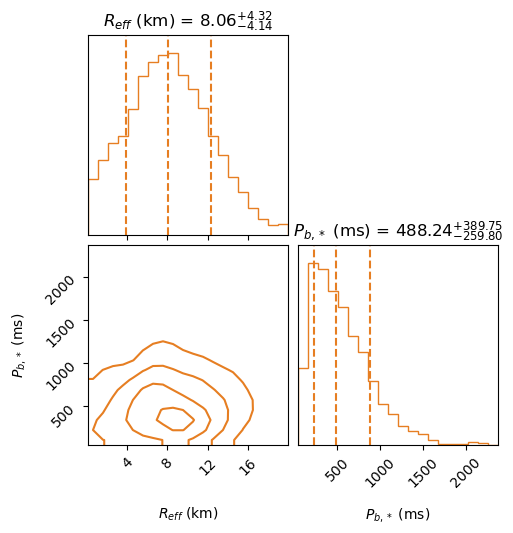

In [3]:
import numpy as np  
    # 以二进制读取模式 (rb) 加载
with open('posterior_young_10param.pkl', 'rb') as f:
    data = pickle.load(f)
        
cols = data["columns"]
samples = data["samples"]
    
    # 动态获取 R_eff 和 Pb_ms 的索引 (这样哪怕换了 8 参、10 参模型，代码也不用改！)
idx_R = cols.index("R_eff")
idx_Pb = cols.index("Pb_ms")
    
    # 完美提取
data_10 = samples[:, [idx_R, idx_Pb]]

import corner
import matplotlib.pyplot as plt
labels = [r"$R_{eff}$ (km)", r"$P_{b,*}$ (ms)"]
# ==========================================
# 玩法一：只画 data_7 的常规 Corner 图 (纯轮廓版)
# ==========================================
fig1 = corner.corner(
    data_10,
    labels=labels,
    color='#E67E22',              
    quantiles=[0.16, 0.5, 0.84],  
    show_titles=True,             
    title_fmt=".2f",
    # === 下面这 4 行是变成“纯轮廓”的魔法 ===
    plot_datapoints=False,  # 关闭最外围的散点
    plot_density=False,     # 关闭二维密度渐变底色
    fill_contours=False,    # 确保轮廓线内部不填充颜色（空心线）
    smooth=1.0,
    alpha=0.7
)
plt.show()

### 9参量

载入 47 个有效观测源。

>>> 启动并行 MCMC (300 核心) - 9参数(Maxwell 分布)版本...


[进度] 2.5% (50/2000) | Acc: 0.30 | ETA: 143.8 min
[进度] 5.0% (100/2000) | Acc: 0.22 | ETA: 164.4 min
[进度] 7.5% (150/2000) | Acc: 0.27 | ETA: 201.1 min
[进度] 10.0% (200/2000) | Acc: 0.22 | ETA: 341.0 min
[进度] 12.5% (250/2000) | Acc: 0.32 | ETA: 357.7 min
[进度] 15.0% (300/2000) | Acc: 0.36 | ETA: 322.4 min
[进度] 17.5% (350/2000) | Acc: 0.39 | ETA: 295.1 min
[进度] 20.0% (400/2000) | Acc: 0.39 | ETA: 276.4 min
[进度] 22.5% (450/2000) | Acc: 0.40 | ETA: 254.2 min
[进度] 25.0% (500/2000) | Acc: 0.39 | ETA: 234.7 min
[进度] 27.5% (550/2000) | Acc: 0.39 | ETA: 222.7 min
[进度] 30.0% (600/2000) | Acc: 0.41 | ETA: 237.9 min
[进度] 32.5% (650/2000) | Acc: 0.42 | ETA: 262.6 min
[进度] 35.0% (700/2000) | Acc: 0.43 | ETA: 271.5 min
[进度] 37.5% (750/2000) | Acc: 0.43 | ETA: 251.7 min
[进度] 40.0% (800/2000) | Acc: 0.45 | ETA: 241.4 min
[进度] 42.5% (850/2000) | Acc: 0.44 | ETA: 227.8 min
[进度] 45.0% (900/2000) | Acc: 0.45 | ETA: 216.5 min
[进度] 47.5% (950/2000) | Acc: 0.46 | ETA: 204.9 min
[进度] 50.0% (1000/2000) | Acc: 0.47 

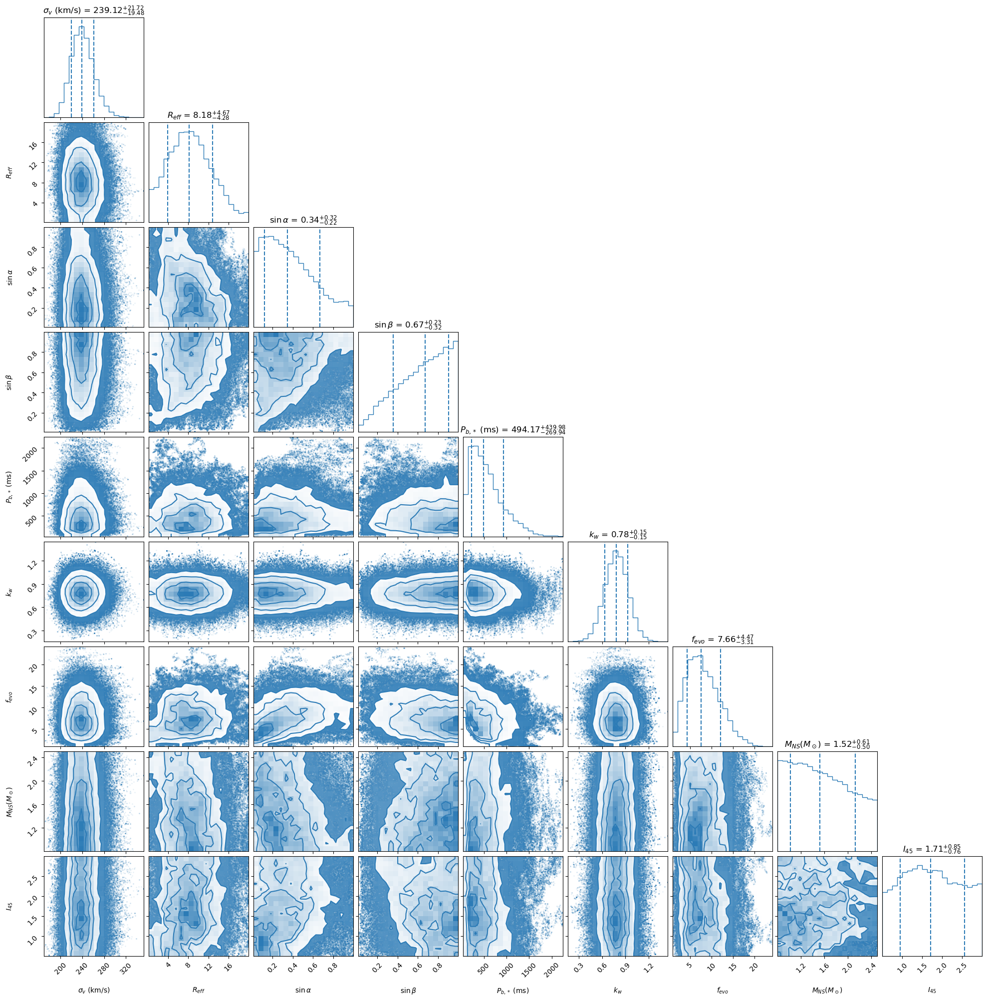

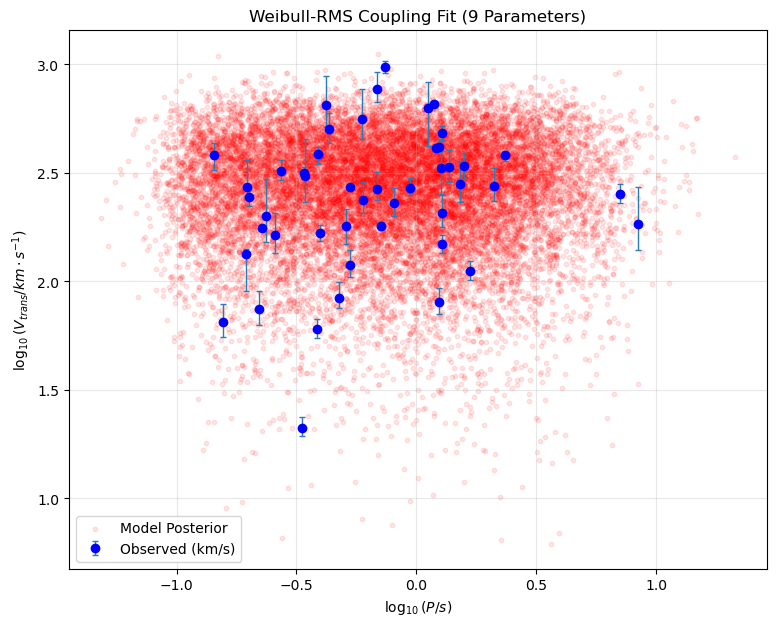

In [9]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde, maxwell, weibull_min, norm
from scipy.special import logsumexp, gamma
import time
import multiprocessing as mp 
import sys

# 尝试导入 corner
try:
    import corner
except ImportError:
    corner = None

# ==========================================
# 1. 物理模型：9参数 (Pb_* 版本 + Sigmoid 平滑 + Maxwell速度分布)
# ==========================================
def simulate_full_population(N_sim, theta):
    """
    theta 参数列表 (9个):
    0. sigma_v: Kick速度 Maxwell 分布的尺度参数 (sigma, 单位 km/s)
    1. R_eff_km: 有效半径 (km)
    2. sin_alpha: 几何因子 alpha 的正弦值
    3. sin_beta: 几何因子 beta 的正弦值
    4. P_b_star_ms: [修改] 基础自旋周期 P_b,* (单位 ms)
    5. k_weibull: Weibull 分布形状参数 k
    6. f_evo: 周期演化因子 <1/(1-tau)>
    7. M_sol: [变量] 中子星质量 (太阳质量)
    8. I_45:  [变量] 转动惯量 (10^45 g cm^2)
    """
    try:
        # [修改] 解包 9 个参数，使用单一速度参数 sigma_v
        sigma_v, R_eff_km, sin_alpha, sin_beta, P_b_star_ms, k_w, f_evo, M_sol, I_45 = theta
    except ValueError:
        return np.array([]), np.array([])

    # [变量] 物理常数计算
    M_ns = M_sol * 1.989e33   # g
    I_ns = I_45 * 1e45        # g cm^2
    
    # [关键修改] 将 P_b (ms) 转换为 S_b (cgs) 用于后续 RMS 计算
    # P_b (ms) -> P_b (s)
    P_b_s = P_b_star_ms * 1e-3
    # S = 2 * pi * I / P
    S_b_star = (2 * np.pi * I_ns) / P_b_s

    # 1. Kick (km/s -> cm/s) - 改为 Maxwell 分布
    v_3d_kms = maxwell.rvs(scale=sigma_v, size=N_sim) 
    v_3d_cgs = v_3d_kms * 1e5 
    
    u = np.random.uniform(-1, 1, N_sim)
    sin_proj = np.sqrt(1 - u**2)
    v_trans = v_3d_cgs * sin_proj

    # 2. RMS Coupling
    R_cgs = R_eff_km * 1e5
    delta_S_dist = (M_ns * R_cgs * sin_alpha * v_trans) / (sin_beta + 1e-10)
    delta_S_sq_mean = np.mean(delta_S_dist**2)
    
    # 这里使用的是刚刚换算得到的 S_b_star
    S0_rms_val = np.sqrt(S_b_star**2 + delta_S_sq_mean)
    
    P0_rms = (2 * np.pi * I_ns) / S0_rms_val

    # 3. Weibull
    gamma_factor = np.sqrt(gamma(1 + 2.0/k_w))
    lambda_w = P0_rms / gamma_factor
    P_birth = weibull_min.rvs(c=k_w, scale=lambda_w, size=N_sim)

    # 4. Evolution & Sigmoid Selection (保留平滑)
    P_obs = P_birth * f_evo
    
    p_detect = 1.0 / (1.0 + np.exp(-(P_obs - 0.1) / 0.01))
    random_roll = np.random.rand(N_sim)
    
    mask = (random_roll < p_detect) & (P_obs < 100) & (v_trans > 0)
    
    return np.log10(P_obs[mask]), np.log10(v_trans[mask])

# ==========================================
# 2. 似然函数
# ==========================================
def log_prior(theta):
    if len(theta) != 9: return -np.inf
    # [修改] 解包 9 参数
    sigma_v, R, sa, sb, Pb_ms, k, f, M_sol, I_45 = theta

    # [修改] 速度分布参数的先验范围 (假设 1D 速度弥散在 10 ~ 1500 km/s 之间)
    if not (10.0 < sigma_v < 1500.0): return -np.inf      
    if not (0.1 < R < 20.0): return -np.inf      
    if not (0.01 < sa < 1.0): return -np.inf     
    if not (0.01 < sb < 1.0): return -np.inf     
    
    # [修改] Pb_ms 的先验范围 (10ms - 5000ms)
    if not (10.0 < Pb_ms < 5000.0): return -np.inf 
    
    if not (0.1 < k < 5.0): return -np.inf       
    if not (1.0 < f < 50.0): return -np.inf      

    if not (0.8 < M_sol < 2.5): return -np.inf 
    if not (0.5 < I_45 < 3.0): return -np.inf 

    return 0.0 

def log_likelihood(theta, obs_data):
    lp = log_prior(theta)
    if not np.isfinite(lp): return -np.inf
    try:
        sim_logP, sim_logV = simulate_full_population(5000, theta)
    except: return -np.inf
    if len(sim_logP) < 50: return -np.inf
    try:
        values = np.vstack([sim_logP, sim_logV])
        kernel = gaussian_kde(values, bw_method='scott') 
        obs_P_mat, obs_V_mat = obs_data
        n_obs, n_samples = obs_P_mat.shape
        check_points = np.vstack([obs_P_mat.ravel(), obs_V_mat.ravel()])
        log_pdf_all = kernel.logpdf(check_points)
        log_pdf_all = np.maximum(log_pdf_all, -100.0)
        log_pdf_mat = log_pdf_all.reshape(n_obs, n_samples)
        log_likelihood_per_star = logsumexp(log_pdf_mat, axis=1) - np.log(n_samples)
        return np.sum(log_likelihood_per_star) + lp 
    except: return -np.inf

# ==========================================
# 3. 单链 MCMC
# ==========================================
def run_single_chain(args):
    seed, start_theta, n_steps, obs_data, is_representative = args
    np.random.seed(seed) 
    ndim = len(start_theta)
    current_theta = np.array(start_theta) * (1 + np.random.normal(0, 0.01, ndim))
    current_lp = log_likelihood(current_theta, obs_data)
    if current_lp == -np.inf:
        current_theta = np.array(start_theta)
        current_lp = log_likelihood(current_theta, obs_data)

    chain = []
    accepted = 0
    # [修改] 步长设置: 缩减为 9 个参数。sigma_v 设为 10.0，Pb_ms 设为 20.0
    step_scale = np.array([10.0, 0.2, 0.02, 0.02, 20.0, 0.05, 0.2, 0.05, 0.05]) 
    
    start_time = time.time()
    for i in range(n_steps):
        proposal = current_theta + np.random.normal(0, 1, ndim) * step_scale
        proposal_lp = log_likelihood(proposal, obs_data)
        if proposal_lp > -np.inf:
            if current_lp == -np.inf: ratio = 1.0
            else: ratio = np.exp(proposal_lp - current_lp)
            if np.random.rand() < ratio:
                current_theta = proposal
                current_lp = proposal_lp
                accepted += 1
        chain.append(current_theta)
        if is_representative and (i + 1) % 50 == 0:
            elapsed = time.time() - start_time
            steps_done = i + 1
            avg_time = elapsed / steps_done
            remain = (n_steps - steps_done) * avg_time
            print(f"[进度] {steps_done/n_steps*100:.1f}% ({steps_done}/{n_steps}) | Acc: {accepted/steps_done:.2f} | ETA: {remain/60:.1f} min")
            sys.stdout.flush()
    return np.array(chain), accepted / n_steps

# ==========================================
# 4. 主程序
# ==========================================
if __name__ == "__main__":
    # --- 数据导入 (请确保路径正确) ---
    base_path = '/home/lz/work/pulsar_kick_period/' 
    try:
        raw_velocities = np.loadtxt(base_path + 'vtrans_49_data.txt')
        raw_periods = np.loadtxt(base_path + 'period_49_data.txt')
        raw_v_err_low = np.loadtxt(base_path + 'v_err_low_49_data.txt')
        raw_v_err_up = np.loadtxt(base_path + 'v_err_up_49_data.txt') 
    except Exception as e:
        print(f"数据加载失败: {e}")
        sys.exit(1)

    mask_period = raw_periods > 0.1 
    mask_velocity = (raw_velocities <= 1000.0) & (raw_velocities > 10.0)
    final_mask = mask_period & mask_velocity
    clean_periods = raw_periods[final_mask]
    clean_velocities = raw_velocities[final_mask]
    clean_err_low = raw_v_err_low[final_mask]
    clean_err_up = raw_v_err_up[final_mask]
    n_obs = len(clean_periods)
    print(f"载入 {n_obs} 个有效观测源。")

    # --- 生成误差云 ---
    N_samples_per_obs = 100 
    obs_velocity_samples = np.zeros((n_obs, N_samples_per_obs))
    np.random.seed(42)
    for i in range(n_obs):
        v_mode = clean_velocities[i]
        sig_low = clean_err_low[i]
        sig_up = clean_err_up[i]
        z = np.random.normal(0, 1, N_samples_per_obs)
        noise = np.where(z < 0, z * sig_low, z * sig_up)
        v_cloud = np.abs(v_mode + noise)
        obs_velocity_samples[i, :] = v_cloud

    obs_logV_cloud = np.log10(obs_velocity_samples * 1e5) 
    obs_logP_cloud = np.tile(np.log10(clean_periods)[:, np.newaxis], (1, N_samples_per_obs))
    obs_data = (obs_logP_cloud, obs_logV_cloud)

    # --- 并行 MCMC ---
    n_cores = 300
    try:
        max_cpu = mp.cpu_count()
        if n_cores > max_cpu: n_cores = max_cpu
    except: pass
        
    print(f"\n>>> 启动并行 MCMC ({n_cores} 核心) - 9参数(Maxwell 分布)版本...")
    
    steps_per_chain = 2000 
    # [修改] 初始猜测 (9参数)，将 sigma_v 初始值设定为 265.0 km/s (Hobbs 分布常用值)
    init_guess = [265.0, 10.0, 0.5, 0.5, 400.0, 1.0, 5.0, 1.4, 1.0]
    
    seeds = [1000 + i for i in range(n_cores)]
    tasks = []
    for i, seed in enumerate(seeds):
        is_representative = (i == 0)
        tasks.append((seed, init_guess, steps_per_chain, obs_data, is_representative))
    
    start_time = time.time()
    results = []
    with mp.Pool(processes=n_cores) as pool:
        iterator = pool.imap_unordered(run_single_chain, tasks)
        for result in iterator:
            results.append(result)
    print(f"\n>>> 计算完成! 耗时: {time.time() - start_time:.1f} s")
    
    # --- 绘图 ---
    all_chains = []
    acc_rates = []
    for chain, acc in results:
        burn_in = int(steps_per_chain * 0.3)
        if len(chain) > burn_in:
            all_chains.append(chain[burn_in:])
        acc_rates.append(acc)

    print(f"平均接受率: {np.mean(acc_rates):.2f}")     
    combined_samples = np.vstack(all_chains)
    best_theta = np.median(combined_samples, axis=0)
    
    # [修改] 标签更新为 9 个，替换前面的 mu_kick 和 sigma_kick
    labels = [
        r"$\sigma_{v}$ (km/s)", r"$R_{eff}$", 
        r"$\sin\alpha$", r"$\sin\beta$", r"$P_{b,*}$ (ms)", 
        r"$k_{w}$", r"$f_{evo}$",
        r"$M_{NS} (M_\odot)$", r"$I_{45}$"
    ]
    
    print("\n>>> 最佳拟合参数 (Median):")
    for l, v in zip(labels, best_theta):
        print(f"{l}: {v:.4f}")

    if corner:
        fig = corner.corner(combined_samples, labels=labels, 
                            quantiles=[0.16, 0.5, 0.84],
                            color='#2C7BB6',
                            show_titles=True, title_fmt=".2f")
        plt.show()

    # 散点图
    sim_logP, sim_logV_cgs = simulate_full_population(20000, best_theta)
    sim_logV_kms = sim_logV_cgs - 5.0 
    
    plt.figure(figsize=(9, 7))
    plt.scatter(sim_logP, sim_logV_kms, s=10, color='red', alpha=0.1, label='Model Posterior')
    
    obs_logP_plot = np.log10(clean_periods)
    obs_logV_plot = np.log10(clean_velocities) 
    yerr_up = np.log10(clean_velocities + clean_err_up) - obs_logV_plot
    v_low_safe = np.maximum(clean_velocities - clean_err_low, 1.0) 
    yerr_low = obs_logV_plot - np.log10(v_low_safe)
    
    plt.errorbar(obs_logP_plot, obs_logV_plot, yerr=[yerr_low, yerr_up], 
                 fmt='o', color='blue', ecolor='#2C7BB6', elinewidth=1, capsize=2, 
                 label='Observed (km/s)', zorder=10)
    
    plt.xlabel(r'$\log_{10}(P / s)$')
    plt.ylabel(r'$\log_{10}(V_{trans} / km \cdot s^{-1})$') 
    plt.title("Weibull-RMS Coupling Fit (9 Parameters)")
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.show()

In [10]:
import pickle  
    # 把列名和数据矩阵打包成一个字典
save_dict = {
    "model_name": "Maxwell_9_Param",
    "columns": ["sigma_v", "R_eff", "sin_alpha", "sin_beta", "Pb_ms", "k_w", "f_evo","M_sol", "I_45"],
    "samples": combined_samples
}
    
    # 以二进制写入模式 (wb) 保存
with open('posterior_young_9param.pkl', 'wb') as f:
    pickle.dump(save_dict, f)
print(">>> 已保存为 pickle 格式！")

>>> 已保存为 pickle 格式！


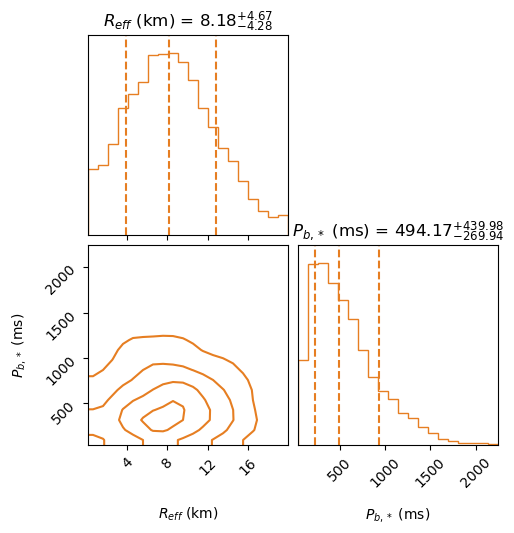

In [11]:
import numpy as np  
    # 以二进制读取模式 (rb) 加载
with open('posterior_young_9param.pkl', 'rb') as f:
    data = pickle.load(f)
        
cols = data["columns"]
samples = data["samples"]
    
    # 动态获取 R_eff 和 Pb_ms 的索引 (这样哪怕换了 8 参、10 参模型，代码也不用改！)
idx_R = cols.index("R_eff")
idx_Pb = cols.index("Pb_ms")
    
    # 完美提取
data_10 = samples[:, [idx_R, idx_Pb]]

import corner
import matplotlib.pyplot as plt
labels = [r"$R_{eff}$ (km)", r"$P_{b,*}$ (ms)"]
# ==========================================
# 玩法一：只画 data_7 的常规 Corner 图 (纯轮廓版)
# ==========================================
fig1 = corner.corner(
    data_10,
    labels=labels,
    color='#E67E22',              
    quantiles=[0.16, 0.5, 0.84],  
    show_titles=True,             
    title_fmt=".2f",
    # === 下面这 4 行是变成“纯轮廓”的魔法 ===
    plot_datapoints=False,  # 关闭最外围的散点
    plot_density=False,     # 关闭二维密度渐变底色
    fill_contours=False,    # 确保轮廓线内部不填充颜色（空心线）
    smooth=1.0,
    alpha=0.7
)
plt.show()

### 8参量

载入 47 个有效观测源。

>>> 启动并行 MCMC (200 核心)...
[进度] 2.5% (50/2000) | Acc: 0.42 | ETA: 218.9 min
[进度] 5.0% (100/2000) | Acc: 0.45 | ETA: 230.8 min
[进度] 7.5% (150/2000) | Acc: 0.44 | ETA: 265.1 min
[进度] 10.0% (200/2000) | Acc: 0.49 | ETA: 242.0 min
[进度] 12.5% (250/2000) | Acc: 0.49 | ETA: 233.1 min
[进度] 15.0% (300/2000) | Acc: 0.48 | ETA: 229.4 min
[进度] 17.5% (350/2000) | Acc: 0.48 | ETA: 220.5 min
[进度] 20.0% (400/2000) | Acc: 0.44 | ETA: 212.0 min
[进度] 22.5% (450/2000) | Acc: 0.43 | ETA: 203.1 min
[进度] 25.0% (500/2000) | Acc: 0.45 | ETA: 196.0 min
[进度] 27.5% (550/2000) | Acc: 0.44 | ETA: 186.7 min
[进度] 30.0% (600/2000) | Acc: 0.43 | ETA: 177.5 min
[进度] 32.5% (650/2000) | Acc: 0.44 | ETA: 171.7 min
[进度] 35.0% (700/2000) | Acc: 0.45 | ETA: 163.2 min
[进度] 37.5% (750/2000) | Acc: 0.46 | ETA: 156.1 min
[进度] 40.0% (800/2000) | Acc: 0.46 | ETA: 147.7 min
[进度] 42.5% (850/2000) | Acc: 0.46 | ETA: 140.7 min
[进度] 45.0% (900/2000) | Acc: 0.46 | ETA: 133.7 min
[进度] 47.5% (950/2000) | Acc: 0.47 | ETA: 127.

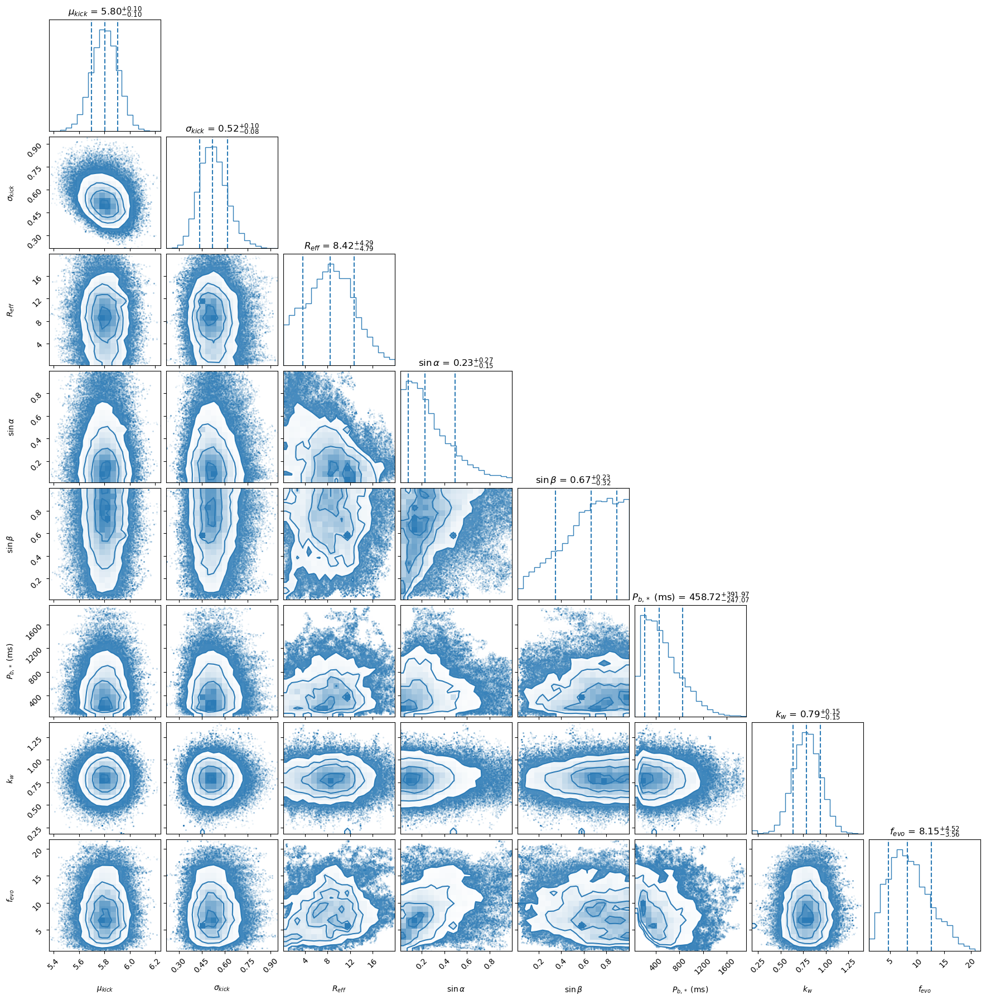

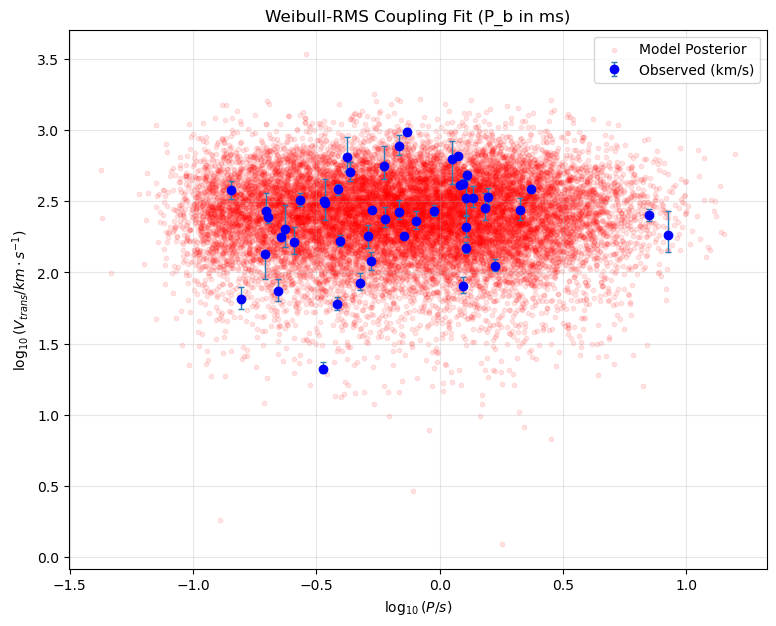

In [5]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde, lognorm, weibull_min, norm
from scipy.special import logsumexp, gamma
import time
import multiprocessing as mp 
import sys

# 尝试导入 corner
try:
    import corner
except ImportError:
    corner = None

# ==========================================
# 1. 物理模型：基于角动量 RMS 耦合与 Weibull 演化
# ==========================================
def simulate_full_population(N_sim, theta):
    """
    theta 参数列表 (8个):
    0. mu_log: Kick速度 Log-Normal 的 mu (对应 ln(km/s))
    1. sigma_log: Kick速度 Log-Normal 的 sigma
    2. R_eff_km: 有效半径 (km)
    3. sin_alpha: 几何因子 alpha 的正弦值
    4. sin_beta: 几何因子 beta 的正弦值
    5. P_b_star_ms: [修改] 基础自旋周期 P_b,* (单位 ms)
    6. k_weibull: Weibull 分布形状参数 k
    7. f_evo: 周期演化因子 <1/(1-tau)>
    """
    try:
        # [修改] 解包 P_b_star_ms
        mu_log, sigma_log, R_eff_km, sin_alpha, sin_beta, P_b_star_ms, k_w, f_evo = theta
    except ValueError:
        return np.array([]), np.array([])

    # 物理常数 (CGS)
    M_ns = 1.4 * 1.989e33  # g
    I_ns = 1e45            # g cm^2
    
    # [修改] 将 P_b,* (ms) 转换为 基础角动量 S_b,* (g cm^2/s)
    # 公式: S = 2 * pi * I / P
    # P 单位是 ms，需要乘 1e-3 转为 s
    P_b_s = P_b_star_ms * 1e-3
    S_b_star = (2 * np.pi * I_ns) / P_b_s

    # ----------------------------------------------------
    # 第一步: 模拟 Kick 速度 v_trans
    # ----------------------------------------------------
    # 生成 3D 速度 (km/s -> cm/s)
    v_3d_kms = lognorm.rvs(s=sigma_log, scale=np.exp(mu_log), size=N_sim) 
    v_3d_cgs = v_3d_kms * 1e5 # cm/s
    
    # 几何投影得到观测的横向速度 v_trans
    u = np.random.uniform(-1, 1, N_sim)
    sin_proj = np.sqrt(1 - u**2)
    v_trans = v_3d_cgs * sin_proj # cm/s

    # ----------------------------------------------------
    # 第二步: 计算角动量 RMS 并推导 P0,rms
    # ----------------------------------------------------
    R_cgs = R_eff_km * 1e5
    # 计算 Delta S (CGS单位)
    delta_S_dist = (M_ns * R_cgs * sin_alpha * v_trans) / (sin_beta + 1e-10)

    # 计算总自旋的均方根 <S0^2> = S_b*^2 + <Delta S^2>
    delta_S_sq_mean = np.mean(delta_S_dist**2)
    S0_rms_val = np.sqrt(S_b_star**2 + delta_S_sq_mean)

    # 将自旋 RMS 转化为周期 RMS
    P0_rms = (2 * np.pi * I_ns) / S0_rms_val

    # ----------------------------------------------------
    # 第三步: 根据 P0,rms 确定 Weibull 参数并抽样
    # ----------------------------------------------------
    gamma_factor = np.sqrt(gamma(1 + 2.0/k_w))
    lambda_w = P0_rms / gamma_factor
    
    # 从 Weibull 分布抽取初始周期 P_birth
    P_birth = weibull_min.rvs(c=k_w, scale=lambda_w, size=N_sim)

    # ----------------------------------------------------
    # 第四步: 周期演化与观测限制
    # ----------------------------------------------------
    P_obs = P_birth * f_evo
    p_detect = 1.0 / (1.0 + np.exp(-(P_obs - 0.1) / 0.01))
    # 蒙特卡洛筛选
    mask = (np.random.rand(len(P_obs)) < p_detect) & (P_obs < 100) & (v_trans > 0)
    # 返回 Log10(P) 和 Log10(V_cgs)
    return np.log10(P_obs[mask]), np.log10(v_trans[mask])
    # 过滤掉非物理或不可观测的点

# ==========================================
# 2. 似然函数与先验
# ==========================================
def log_prior(theta):
    if len(theta) != 8: return -np.inf
    mu, sig, R, sa, sb, Pb_ms, k, f = theta # [修改] Pb_ms

    # 设定合理的物理参数范围
    if not (4.0 < mu < 7.5): return -np.inf      
    if not (0.1 < sig < 2.0): return -np.inf     
    if not (0.1 < R < 20.0): return -np.inf      
    if not (0.01 < sa < 1.0): return -np.inf     
    if not (0.01 < sb < 1.0): return -np.inf     
    
    # [修改] P_b,* (ms) 的先验范围
    # 10 ms (极快) 到 5000 ms (5s, 极慢)
    if not (10.0 < Pb_ms < 5000.0): return -np.inf 
    
    if not (0.1 < k < 5.0): return -np.inf       
    if not (1.0 < f < 50.0): return -np.inf      

    return 0.0 

def log_likelihood(theta, obs_data):
    # obs_data 是 (P_cloud, V_cloud) -> V_cloud 是 log10(cm/s)
    lp = log_prior(theta)
    if not np.isfinite(lp): return -np.inf
    
    try:
        sim_logP, sim_logV = simulate_full_population(5000, theta)
    except: return -np.inf
    
    if len(sim_logP) < 50: return -np.inf
    
    try:
        values = np.vstack([sim_logP, sim_logV])
        kernel = gaussian_kde(values, bw_method='scott') 
        
        obs_P_mat, obs_V_mat = obs_data
        n_obs, n_samples = obs_P_mat.shape
        
        check_points = np.vstack([obs_P_mat.ravel(), obs_V_mat.ravel()])
        log_pdf_all = kernel.logpdf(check_points)
        log_pdf_all = np.maximum(log_pdf_all, -100.0)
        
        log_pdf_mat = log_pdf_all.reshape(n_obs, n_samples)
        log_likelihood_per_star = logsumexp(log_pdf_mat, axis=1) - np.log(n_samples)
        
        return np.sum(log_likelihood_per_star) + lp 
    except: return -np.inf

# ==========================================
# 3. 单链 MCMC 运行函数
# ==========================================
def run_single_chain(args):
    seed, start_theta, n_steps, obs_data, is_representative = args
    
    np.random.seed(seed) 
    ndim = len(start_theta)
    
    # 初始微扰
    current_theta = np.array(start_theta) * (1 + np.random.normal(0, 0.01, ndim))
    
    # 确保初始点有效
    current_lp = log_likelihood(current_theta, obs_data)
    if current_lp == -np.inf:
        current_theta = np.array(start_theta)
        current_lp = log_likelihood(current_theta, obs_data)

    chain = []
    accepted = 0
    # [修改] 步长设置: 针对 P_b_ms (几百的量级) 调大步长
    # 原来 index 5 是 0.1, 现在改为 20.0 (ms)
    step_scale = np.array([0.05, 0.03, 0.2, 0.02, 0.02, 20.0, 0.05, 0.2]) 
    
    start_time = time.time()
    
    for i in range(n_steps):
        proposal = current_theta + np.random.normal(0, 1, ndim) * step_scale
        proposal_lp = log_likelihood(proposal, obs_data)
        
        if proposal_lp > -np.inf:
            if current_lp == -np.inf: ratio = 1.0
            else: ratio = np.exp(proposal_lp - current_lp)
            
            if np.random.rand() < ratio:
                current_theta = proposal
                current_lp = proposal_lp
                accepted += 1
        
        chain.append(current_theta)
        
        if is_representative and (i + 1) % 50 == 0:
            elapsed = time.time() - start_time
            steps_done = i + 1
            avg_time = elapsed / steps_done
            remain = (n_steps - steps_done) * avg_time
            
            print(f"[进度] {steps_done/n_steps*100:.1f}% ({steps_done}/{n_steps}) | Acc: {accepted/steps_done:.2f} | ETA: {remain/60:.1f} min")
            sys.stdout.flush()
            
    return np.array(chain), accepted / n_steps

# ==========================================
# 4. 主程序
# ==========================================
if __name__ == "__main__":
    # -------------------------------------------------
    # 1. 数据导入
    # -------------------------------------------------
    base_path = '/home/lz/work/pulsar_kick_period/' 
    try:
        raw_velocities = np.loadtxt(base_path + 'vtrans_49_data.txt')
        raw_periods = np.loadtxt(base_path + 'period_49_data.txt')
        raw_v_err_low = np.loadtxt(base_path + 'v_err_low_49_data.txt')
        raw_v_err_up = np.loadtxt(base_path + 'v_err_up_49_data.txt') 
    except Exception as e:
        print(f"数据加载失败: {e}")
        sys.exit(1)

    # 数据清洗
    mask_period = raw_periods > 0.1 
    mask_velocity = (raw_velocities <= 1000.0) & (raw_velocities > 10.0)
    final_mask = mask_period & mask_velocity
    
    clean_periods = raw_periods[final_mask]
    clean_velocities = raw_velocities[final_mask]
    clean_err_low = raw_v_err_low[final_mask]
    clean_err_up = raw_v_err_up[final_mask]
    n_obs = len(clean_periods)

    print(f"载入 {n_obs} 个有效观测源。")

    # -------------------------------------------------
    # 2. 生成非对称误差云
    # -------------------------------------------------
    N_samples_per_obs = 100 
    obs_velocity_samples = np.zeros((n_obs, N_samples_per_obs))

    np.random.seed(42)
    for i in range(n_obs):
        v_mode = clean_velocities[i]
        sig_low = clean_err_low[i]
        sig_up = clean_err_up[i]
        
        z = np.random.normal(0, 1, N_samples_per_obs)
        noise = np.where(z < 0, z * sig_low, z * sig_up)
        
        v_cloud = np.abs(v_mode + noise)
        obs_velocity_samples[i, :] = v_cloud

    obs_logV_cloud = np.log10(obs_velocity_samples * 1e5) 
    obs_logP_cloud = np.tile(np.log10(clean_periods)[:, np.newaxis], (1, N_samples_per_obs))
    obs_data = (obs_logP_cloud, obs_logV_cloud)

    # -------------------------------------------------
    # 3. 并行 MCMC 设置
    # -------------------------------------------------
    n_cores = 200
    try:
        max_cpu = mp.cpu_count()
        if n_cores > max_cpu: n_cores = max_cpu
    except: pass
        
    print(f"\n>>> 启动并行 MCMC ({n_cores} 核心)...")
    
    steps_per_chain = 2000 
    # [修改] 初始猜测
    # P_b_ms 初始值设为 400.0 ms (对应之前的 S_b ~ 1.5e46)
    # [mu, sig, R, sa, sb, Pb_ms, k, f]
    init_guess = [5.5, 0.5, 10.0, 0.5, 0.5, 400.0, 1.0, 5.0]
    seeds = [1000 + i for i in range(n_cores)]
    
    tasks = []
    for i, seed in enumerate(seeds):
        is_representative = (i == 0)
        tasks.append((seed, init_guess, steps_per_chain, obs_data, is_representative))
    
    start_time = time.time()
    
    results = []
    with mp.Pool(processes=n_cores) as pool:
        iterator = pool.imap_unordered(run_single_chain, tasks)
        for result in iterator:
            results.append(result)

    print(f"\n>>> 计算完成! 耗时: {time.time() - start_time:.1f} s")
    
    # -------------------------------------------------
    # 4. 结果处理与绘图
    # -------------------------------------------------
    all_chains = []
    acc_rates = []
    for chain, acc in results:
        burn_in = int(steps_per_chain * 0.3)
        if len(chain) > burn_in:
            all_chains.append(chain[burn_in:])
        acc_rates.append(acc)

    print(f"平均接受率: {np.mean(acc_rates):.2f}")     
    combined_samples = np.vstack(all_chains)
    best_theta = np.median(combined_samples, axis=0)
    
    # [修改] 标签
    labels = [
        r"$\mu_{kick}$", r"$\sigma_{kick}$", r"$R_{eff}$", 
        r"$\sin\alpha$", r"$\sin\beta$", r"$P_{b,*}$ (ms)", 
        r"$k_{w}$", r"$f_{evo}$"
    ]
    
    print("\n>>> 最佳拟合参数 (Median):")
    for l, v in zip(labels, best_theta):
        print(f"{l}: {v:.4f}")

    if corner:
        fig = corner.corner(combined_samples, labels=labels, 
                            quantiles=[0.16, 0.5, 0.84],
                            color='#2C7BB6',
                            show_titles=True, title_fmt=".2f")
        plt.show()

    # --- 散点对比图 ---
    sim_logP, sim_logV_cgs = simulate_full_population(20000, best_theta)
    sim_logV_kms = sim_logV_cgs - 5.0 
    
    plt.figure(figsize=(9, 7))
    plt.scatter(sim_logP, sim_logV_kms, s=10, color='red', alpha=0.1, label='Model Posterior')
    
    obs_logP_plot = np.log10(clean_periods)
    obs_logV_plot = np.log10(clean_velocities) 
    
    yerr_up = np.log10(clean_velocities + clean_err_up) - obs_logV_plot
    v_low_safe = np.maximum(clean_velocities - clean_err_low, 1.0) 
    yerr_low = obs_logV_plot - np.log10(v_low_safe)
    
    plt.errorbar(obs_logP_plot, obs_logV_plot, yerr=[yerr_low, yerr_up], 
                 fmt='o', color='blue', ecolor='#2C7BB6', elinewidth=1, capsize=2, 
                 label='Observed (km/s)', zorder=10)
    
    plt.xlabel(r'$\log_{10}(P / s)$')
    plt.ylabel(r'$\log_{10}(V_{trans} / km \cdot s^{-1})$') 
    plt.title("Weibull-RMS Coupling Fit (P_b in ms)")
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.show()

In [6]:
import pickle  
    # 把列名和数据矩阵打包成一个字典
save_dict = {
    "model_name": "Lognormal_8_Param",
    "columns": ["mu","sigma_v", "R_eff", "sin_alpha", "sin_beta", "Pb_ms", "k_w", "f_evo"],
    "samples": combined_samples
}
    
    # 以二进制写入模式 (wb) 保存
with open('posterior_young_8param.pkl', 'wb') as f:
    pickle.dump(save_dict, f)
print(">>> 已保存为 pickle 格式！")

>>> 已保存为 pickle 格式！


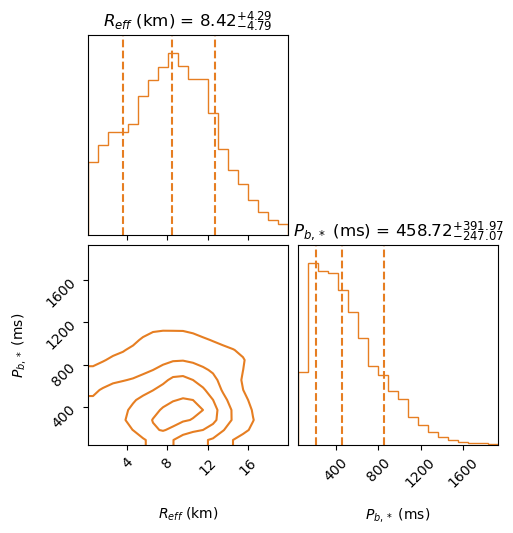

In [8]:
import numpy as np  
    # 以二进制读取模式 (rb) 加载
with open('posterior_young_8param.pkl', 'rb') as f:
    data = pickle.load(f)
        
cols = data["columns"]
samples = data["samples"]
    
    # 动态获取 R_eff 和 Pb_ms 的索引 (这样哪怕换了 8 参、10 参模型，代码也不用改！)
idx_R = cols.index("R_eff")
idx_Pb = cols.index("Pb_ms")
    
    # 完美提取
data_10 = samples[:, [idx_R, idx_Pb]]

import corner
import matplotlib.pyplot as plt
labels = [r"$R_{eff}$ (km)", r"$P_{b,*}$ (ms)"]
# ==========================================
# 玩法一：只画 data_7 的常规 Corner 图 (纯轮廓版)
# ==========================================
fig1 = corner.corner(
    data_10,
    labels=labels,
    color='#E67E22',              
    quantiles=[0.16, 0.5, 0.84],  
    show_titles=True,             
    title_fmt=".2f",
    # === 下面这 4 行是变成“纯轮廓”的魔法 ===
    plot_datapoints=False,  # 关闭最外围的散点
    plot_density=False,     # 关闭二维密度渐变底色
    fill_contours=False,    # 确保轮廓线内部不填充颜色（空心线）
    smooth=1.0,
    alpha=0.7
)
plt.show()

载入 47 个有效观测源。

>>> 启动并行 MCMC (200 核心)...
[进度] 2.5% (50/2000) | Acc: 0.32 | ETA: 63.1 min
[进度] 5.0% (100/2000) | Acc: 0.23 | ETA: 63.5 min
[进度] 7.5% (150/2000) | Acc: 0.23 | ETA: 66.5 min
[进度] 10.0% (200/2000) | Acc: 0.26 | ETA: 76.6 min
[进度] 12.5% (250/2000) | Acc: 0.30 | ETA: 83.4 min
[进度] 15.0% (300/2000) | Acc: 0.31 | ETA: 95.8 min
[进度] 17.5% (350/2000) | Acc: 0.34 | ETA: 103.7 min
[进度] 20.0% (400/2000) | Acc: 0.36 | ETA: 112.2 min
[进度] 22.5% (450/2000) | Acc: 0.36 | ETA: 115.5 min
[进度] 25.0% (500/2000) | Acc: 0.38 | ETA: 117.4 min
[进度] 27.5% (550/2000) | Acc: 0.41 | ETA: 119.3 min
[进度] 30.0% (600/2000) | Acc: 0.42 | ETA: 117.7 min
[进度] 32.5% (650/2000) | Acc: 0.41 | ETA: 116.3 min
[进度] 35.0% (700/2000) | Acc: 0.42 | ETA: 112.8 min
[进度] 37.5% (750/2000) | Acc: 0.41 | ETA: 109.8 min
[进度] 40.0% (800/2000) | Acc: 0.42 | ETA: 108.5 min
[进度] 42.5% (850/2000) | Acc: 0.42 | ETA: 104.0 min
[进度] 45.0% (900/2000) | Acc: 0.43 | ETA: 101.8 min
[进度] 47.5% (950/2000) | Acc: 0.43 | ETA: 97.0 min
[

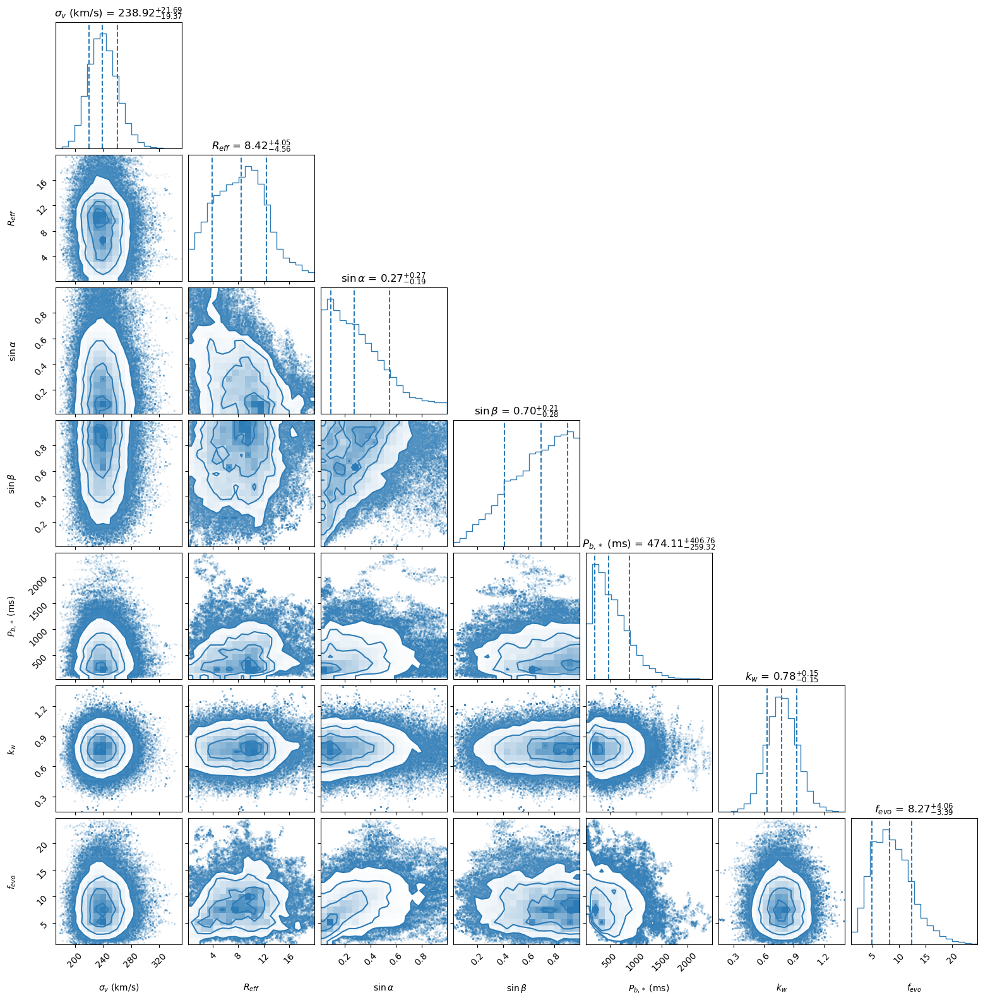

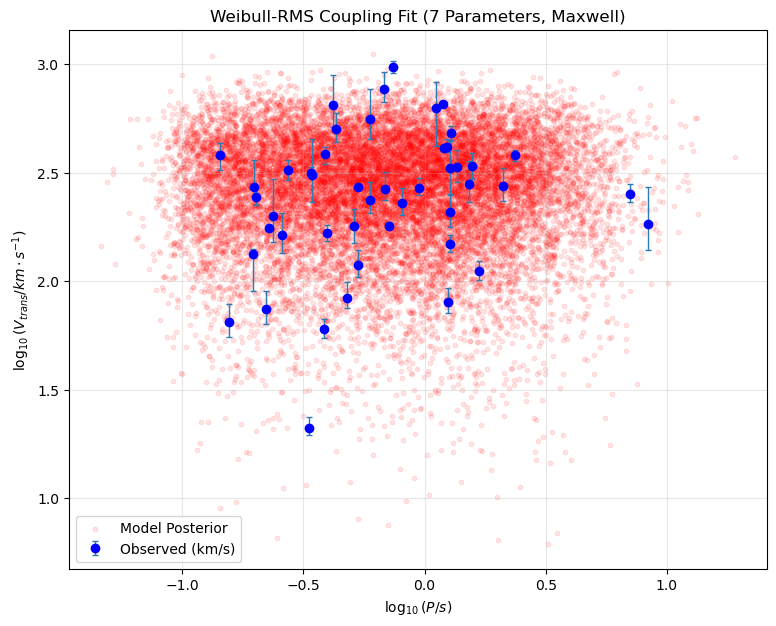

In [3]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde, maxwell, weibull_min, norm
from scipy.special import logsumexp, gamma
import time
import multiprocessing as mp 
import sys

# 尝试导入 corner
try:
    import corner
except ImportError:
    corner = None

# ==========================================
# 1. 物理模型：基于角动量 RMS 耦合与 Weibull 演化
# ==========================================
def simulate_full_population(N_sim, theta):
    """
    theta 参数列表 (7个):
    0. sigma_v: Kick速度 Maxwell 分布的尺度参数 (sigma, 单位 km/s)
    1. R_eff_km: 有效半径 (km)
    2. sin_alpha: 几何因子 alpha 的正弦值
    3. sin_beta: 几何因子 beta 的正弦值
    4. P_b_star_ms: [修改] 基础自旋周期 P_b,* (单位 ms)
    5. k_weibull: Weibull 分布形状参数 k
    6. f_evo: 周期演化因子 <1/(1-tau)>
    """
    try:
        # [修改] 解包 7 个参数，使用单一速度参数 sigma_v
        sigma_v, R_eff_km, sin_alpha, sin_beta, P_b_star_ms, k_w, f_evo = theta
    except ValueError:
        return np.array([]), np.array([])

    # 物理常数 (CGS)
    M_ns = 1.4 * 1.989e33  # g
    I_ns = 1e45            # g cm^2
    
    # [修改] 将 P_b,* (ms) 转换为 基础角动量 S_b,* (g cm^2/s)
    # 公式: S = 2 * pi * I / P
    # P 单位是 ms，需要乘 1e-3 转为 s
    P_b_s = P_b_star_ms * 1e-3
    S_b_star = (2 * np.pi * I_ns) / P_b_s

    # ----------------------------------------------------
    # 第一步: 模拟 Kick 速度 v_trans
    # ----------------------------------------------------
    # 生成 3D 速度 (km/s -> cm/s) - [修改] 改为 Maxwell 分布
    v_3d_kms = maxwell.rvs(scale=sigma_v, size=N_sim) 
    v_3d_cgs = v_3d_kms * 1e5 # cm/s
    
    # 几何投影得到观测的横向速度 v_trans
    u = np.random.uniform(-1, 1, N_sim)
    sin_proj = np.sqrt(1 - u**2)
    v_trans = v_3d_cgs * sin_proj # cm/s

    # ----------------------------------------------------
    # 第二步: 计算角动量 RMS 并推导 P0,rms
    # ----------------------------------------------------
    R_cgs = R_eff_km * 1e5
    # 计算 Delta S (CGS单位)
    delta_S_dist = (M_ns * R_cgs * sin_alpha * v_trans) / (sin_beta + 1e-10)

    # 计算总自旋的均方根 <S0^2> = S_b*^2 + <Delta S^2>
    delta_S_sq_mean = np.mean(delta_S_dist**2)
    S0_rms_val = np.sqrt(S_b_star**2 + delta_S_sq_mean)

    # 将自旋 RMS 转化为周期 RMS
    P0_rms = (2 * np.pi * I_ns) / S0_rms_val

    # ----------------------------------------------------
    # 第三步: 根据 P0,rms 确定 Weibull 参数并抽样
    # ----------------------------------------------------
    gamma_factor = np.sqrt(gamma(1 + 2.0/k_w))
    lambda_w = P0_rms / gamma_factor
    
    # 从 Weibull 分布抽取初始周期 P_birth
    P_birth = weibull_min.rvs(c=k_w, scale=lambda_w, size=N_sim)

    # ----------------------------------------------------
    # 第四步: 周期演化与观测限制
    # ----------------------------------------------------
    P_obs = P_birth * f_evo
    p_detect = 1.0 / (1.0 + np.exp(-(P_obs - 0.1) / 0.01))
    # 蒙特卡洛筛选
    mask = (np.random.rand(len(P_obs)) < p_detect) & (P_obs < 100) & (v_trans > 0)
    # 返回 Log10(P) 和 Log10(V_cgs)
    return np.log10(P_obs[mask]), np.log10(v_trans[mask])
    # 过滤掉非物理或不可观测的点

# ==========================================
# 2. 似然函数与先验
# ==========================================
def log_prior(theta):
    if len(theta) != 7: return -np.inf
    # [修改] 解析 7 个参数
    sigma_v, R, sa, sb, Pb_ms, k, f = theta 

    # 设定合理的物理参数范围
    # [修改] 速度分布参数的先验范围 (假设 1D 速度弥散在 10 ~ 1500 km/s 之间)
    if not (10.0 < sigma_v < 1500.0): return -np.inf      
    if not (0.1 < R < 20.0): return -np.inf      
    if not (0.01 < sa < 1.0): return -np.inf     
    if not (0.01 < sb < 1.0): return -np.inf     
    
    # P_b,* (ms) 的先验范围
    # 10 ms (极快) 到 5000 ms (5s, 极慢)
    if not (10.0 < Pb_ms < 5000.0): return -np.inf 
    
    if not (0.1 < k < 5.0): return -np.inf       
    if not (1.0 < f < 50.0): return -np.inf      

    return 0.0 

def log_likelihood(theta, obs_data):
    # obs_data 是 (P_cloud, V_cloud) -> V_cloud 是 log10(cm/s)
    lp = log_prior(theta)
    if not np.isfinite(lp): return -np.inf
    
    try:
        sim_logP, sim_logV = simulate_full_population(5000, theta)
    except: return -np.inf
    
    if len(sim_logP) < 50: return -np.inf
    
    try:
        values = np.vstack([sim_logP, sim_logV])
        kernel = gaussian_kde(values, bw_method='scott') 
        
        obs_P_mat, obs_V_mat = obs_data
        n_obs, n_samples = obs_P_mat.shape
        
        check_points = np.vstack([obs_P_mat.ravel(), obs_V_mat.ravel()])
        log_pdf_all = kernel.logpdf(check_points)
        log_pdf_all = np.maximum(log_pdf_all, -100.0)
        
        log_pdf_mat = log_pdf_all.reshape(n_obs, n_samples)
        log_likelihood_per_star = logsumexp(log_pdf_mat, axis=1) - np.log(n_samples)
        
        return np.sum(log_likelihood_per_star) + lp 
    except: return -np.inf

# ==========================================
# 3. 单链 MCMC 运行函数
# ==========================================
def run_single_chain(args):
    seed, start_theta, n_steps, obs_data, is_representative = args
    
    np.random.seed(seed) 
    ndim = len(start_theta)
    
    # 初始微扰
    current_theta = np.array(start_theta) * (1 + np.random.normal(0, 0.01, ndim))
    
    # 确保初始点有效
    current_lp = log_likelihood(current_theta, obs_data)
    if current_lp == -np.inf:
        current_theta = np.array(start_theta)
        current_lp = log_likelihood(current_theta, obs_data)

    chain = []
    accepted = 0
    # [修改] 步长设置: 缩减为 7 个参数。针对 sigma_v 设为 10.0
    step_scale = np.array([10.0, 0.2, 0.02, 0.02, 20.0, 0.05, 0.2]) 
    
    start_time = time.time()
    
    for i in range(n_steps):
        proposal = current_theta + np.random.normal(0, 1, ndim) * step_scale
        proposal_lp = log_likelihood(proposal, obs_data)
        
        if proposal_lp > -np.inf:
            if current_lp == -np.inf: ratio = 1.0
            else: ratio = np.exp(proposal_lp - current_lp)
            
            if np.random.rand() < ratio:
                current_theta = proposal
                current_lp = proposal_lp
                accepted += 1
        
        chain.append(current_theta)
        
        if is_representative and (i + 1) % 50 == 0:
            elapsed = time.time() - start_time
            steps_done = i + 1
            avg_time = elapsed / steps_done
            remain = (n_steps - steps_done) * avg_time
            
            print(f"[进度] {steps_done/n_steps*100:.1f}% ({steps_done}/{n_steps}) | Acc: {accepted/steps_done:.2f} | ETA: {remain/60:.1f} min")
            sys.stdout.flush()
            
    return np.array(chain), accepted / n_steps

# ==========================================
# 4. 主程序
# ==========================================
if __name__ == "__main__":
    # -------------------------------------------------
    # 1. 数据导入
    # -------------------------------------------------
    base_path = '/home/lz/work/pulsar_kick_period/' 
    try:
        raw_velocities = np.loadtxt(base_path + 'vtrans_49_data.txt')
        raw_periods = np.loadtxt(base_path + 'period_49_data.txt')
        raw_v_err_low = np.loadtxt(base_path + 'v_err_low_49_data.txt')
        raw_v_err_up = np.loadtxt(base_path + 'v_err_up_49_data.txt') 
    except Exception as e:
        print(f"数据加载失败: {e}")
        sys.exit(1)

    # 数据清洗
    mask_period = raw_periods > 0.1 
    mask_velocity = (raw_velocities <= 1000.0) & (raw_velocities > 10.0)
    final_mask = mask_period & mask_velocity
    
    clean_periods = raw_periods[final_mask]
    clean_velocities = raw_velocities[final_mask]
    clean_err_low = raw_v_err_low[final_mask]
    clean_err_up = raw_v_err_up[final_mask]
    n_obs = len(clean_periods)

    print(f"载入 {n_obs} 个有效观测源。")

    # -------------------------------------------------
    # 2. 生成非对称误差云
    # -------------------------------------------------
    N_samples_per_obs = 100 
    obs_velocity_samples = np.zeros((n_obs, N_samples_per_obs))

    np.random.seed(42)
    for i in range(n_obs):
        v_mode = clean_velocities[i]
        sig_low = clean_err_low[i]
        sig_up = clean_err_up[i]
        
        z = np.random.normal(0, 1, N_samples_per_obs)
        noise = np.where(z < 0, z * sig_low, z * sig_up)
        
        v_cloud = np.abs(v_mode + noise)
        obs_velocity_samples[i, :] = v_cloud

    obs_logV_cloud = np.log10(obs_velocity_samples * 1e5) 
    obs_logP_cloud = np.tile(np.log10(clean_periods)[:, np.newaxis], (1, N_samples_per_obs))
    obs_data = (obs_logP_cloud, obs_logV_cloud)

    # -------------------------------------------------
    # 3. 并行 MCMC 设置
    # -------------------------------------------------
    n_cores = 200
    try:
        max_cpu = mp.cpu_count()
        if n_cores > max_cpu: n_cores = max_cpu
    except: pass
        
    print(f"\n>>> 启动并行 MCMC ({n_cores} 核心)...")
    
    steps_per_chain = 2000 
    # [修改] 初始猜测: 7个参数
    # [sigma_v, R, sa, sb, Pb_ms, k, f]
    init_guess = [265.0, 10.0, 0.5, 0.5, 400.0, 1.0, 5.0]
    seeds = [1000 + i for i in range(n_cores)]
    
    tasks = []
    for i, seed in enumerate(seeds):
        is_representative = (i == 0)
        tasks.append((seed, init_guess, steps_per_chain, obs_data, is_representative))
    
    start_time = time.time()
    
    results = []
    with mp.Pool(processes=n_cores) as pool:
        iterator = pool.imap_unordered(run_single_chain, tasks)
        for result in iterator:
            results.append(result)

    print(f"\n>>> 计算完成! 耗时: {time.time() - start_time:.1f} s")
    
    # -------------------------------------------------
    # 4. 结果处理与绘图
    # -------------------------------------------------
    all_chains = []
    acc_rates = []
    for chain, acc in results:
        burn_in = int(steps_per_chain * 0.3)
        if len(chain) > burn_in:
            all_chains.append(chain[burn_in:])
        acc_rates.append(acc)

    print(f"平均接受率: {np.mean(acc_rates):.2f}")     
    combined_samples = np.vstack(all_chains)
    best_theta = np.median(combined_samples, axis=0)
    
    # [修改] 标签：7 个参数
    labels = [
        r"$\sigma_{v}$ (km/s)", r"$R_{eff}$", 
        r"$\sin\alpha$", r"$\sin\beta$", r"$P_{b,*}$ (ms)", 
        r"$k_{w}$", r"$f_{evo}$"
    ]
    
    print("\n>>> 最佳拟合参数 (Median):")
    for l, v in zip(labels, best_theta):
        print(f"{l}: {v:.4f}")

    if corner:
        fig = corner.corner(combined_samples, labels=labels, 
                            quantiles=[0.16, 0.5, 0.84],
                            color='#2C7BB6',
                            show_titles=True, title_fmt=".2f")
        plt.show()

    # --- 散点对比图 ---
    sim_logP, sim_logV_cgs = simulate_full_population(20000, best_theta)
    sim_logV_kms = sim_logV_cgs - 5.0 
    
    plt.figure(figsize=(9, 7))
    plt.scatter(sim_logP, sim_logV_kms, s=10, color='red', alpha=0.1, label='Model Posterior')
    
    obs_logP_plot = np.log10(clean_periods)
    obs_logV_plot = np.log10(clean_velocities) 
    
    yerr_up = np.log10(clean_velocities + clean_err_up) - obs_logV_plot
    v_low_safe = np.maximum(clean_velocities - clean_err_low, 1.0) 
    yerr_low = obs_logV_plot - np.log10(v_low_safe)
    
    plt.errorbar(obs_logP_plot, obs_logV_plot, yerr=[yerr_low, yerr_up], 
                 fmt='o', color='blue', ecolor='#2C7BB6', elinewidth=1, capsize=2, 
                 label='Observed (km/s)', zorder=10)
    
    plt.xlabel(r'$\log_{10}(P / s)$')
    plt.ylabel(r'$\log_{10}(V_{trans} / km \cdot s^{-1})$') 
    plt.title("Weibull-RMS Coupling Fit (7 Parameters, Maxwell)")
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.show()

In [4]:
import pickle  
    # 把列名和数据矩阵打包成一个字典
save_dict = {
    "model_name": "Maxwell_7_Param",
    "columns": ["sigma_v", "R_eff", "sin_alpha", "sin_beta", "Pb_ms", "k_w", "f_evo"],
    "samples": combined_samples
}
    
    # 以二进制写入模式 (wb) 保存
with open('posterior_young_7param.pkl', 'wb') as f:
    pickle.dump(save_dict, f)
print(">>> 已保存为 pickle 格式！")

>>> 已保存为 pickle 格式！


### 10参数Gamma分布

载入 47 个有效观测源。

>>> 启动并行 MCMC (200 核心) - 10参数 (Gamma 速度模型)...
[进度] 2.5% (50/2000) | Acc: 0.26 | ETA: 228.3 min
[进度] 5.0% (100/2000) | Acc: 0.36 | ETA: 242.7 min
[进度] 7.5% (150/2000) | Acc: 0.37 | ETA: 357.6 min
[进度] 10.0% (200/2000) | Acc: 0.37 | ETA: 423.4 min
[进度] 12.5% (250/2000) | Acc: 0.42 | ETA: 449.2 min
[进度] 15.0% (300/2000) | Acc: 0.44 | ETA: 397.6 min
[进度] 17.5% (350/2000) | Acc: 0.43 | ETA: 371.2 min
[进度] 20.0% (400/2000) | Acc: 0.44 | ETA: 332.9 min
[进度] 22.5% (450/2000) | Acc: 0.42 | ETA: 302.2 min
[进度] 25.0% (500/2000) | Acc: 0.42 | ETA: 278.7 min
[进度] 27.5% (550/2000) | Acc: 0.43 | ETA: 256.2 min
[进度] 30.0% (600/2000) | Acc: 0.43 | ETA: 246.7 min
[进度] 32.5% (650/2000) | Acc: 0.42 | ETA: 243.8 min
[进度] 35.0% (700/2000) | Acc: 0.41 | ETA: 258.5 min
[进度] 37.5% (750/2000) | Acc: 0.41 | ETA: 276.4 min
[进度] 40.0% (800/2000) | Acc: 0.42 | ETA: 258.2 min
[进度] 42.5% (850/2000) | Acc: 0.42 | ETA: 242.1 min
[进度] 45.0% (900/2000) | Acc: 0.43 | ETA: 225.6 min
[进度] 47.5% (950/2000) | A

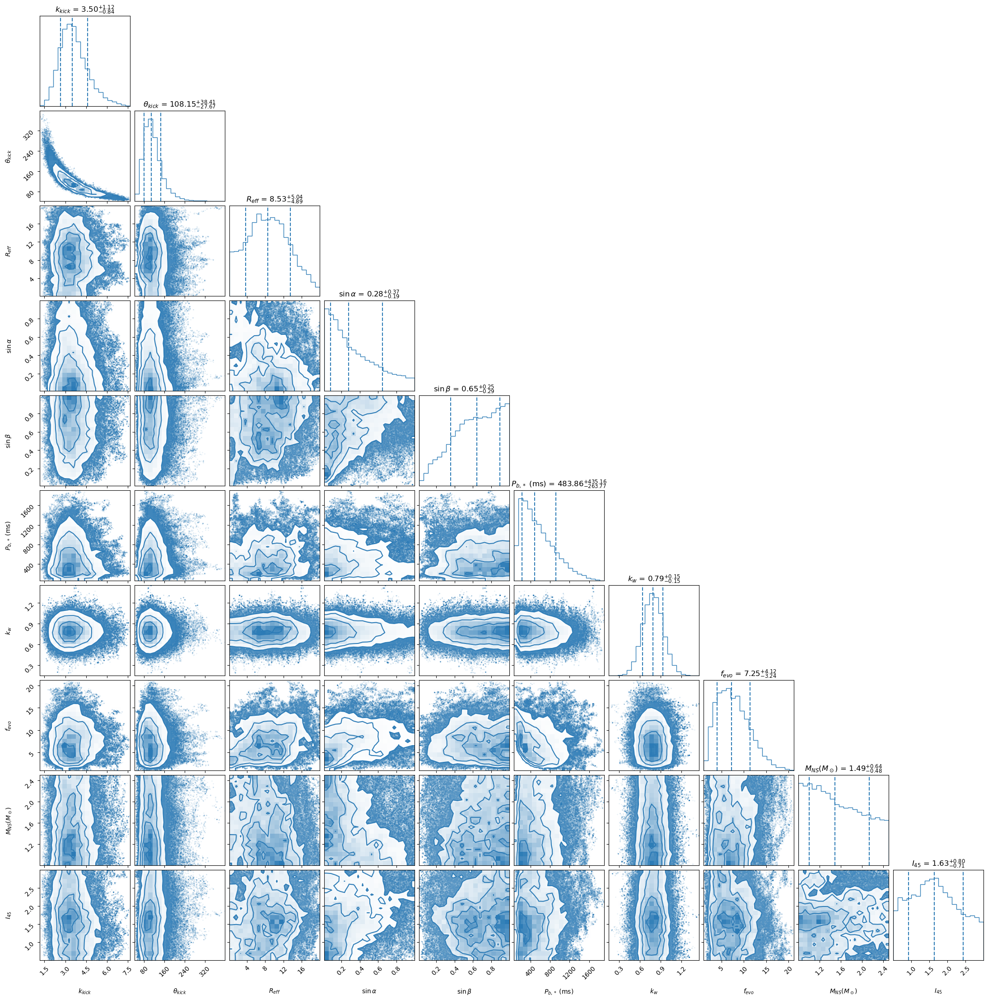

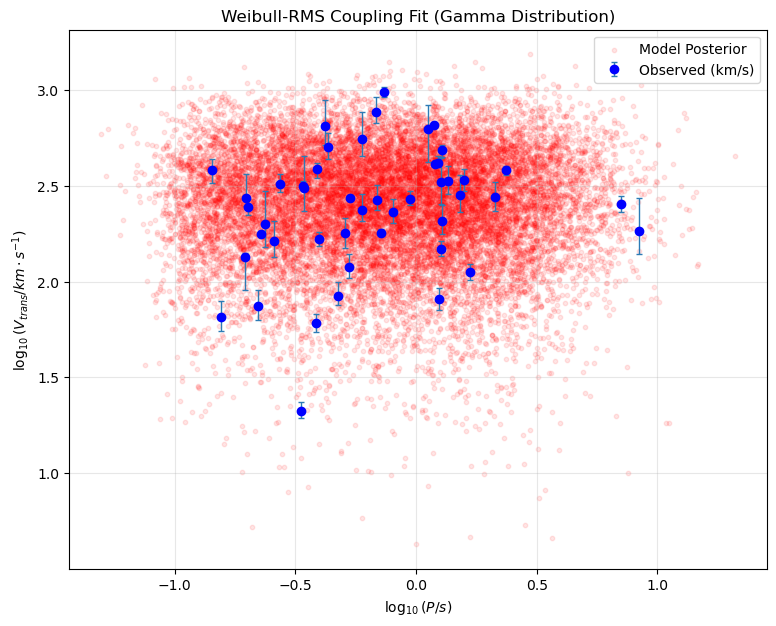

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde, gamma as gamma_dist, weibull_min, norm
from scipy.special import logsumexp, gamma
import time
import multiprocessing as mp 
import sys

# 尝试导入 corner
try:
    import corner
except ImportError:
    corner = None

# ==========================================
# 1. 物理模型：10参数 (Pb_* 版本 + Sigmoid 平滑 + Gamma 速度分布)
# ==========================================
def simulate_full_population(N_sim, theta):
    """
    theta 参数列表 (10个):
    0. k_kick: [修改] Kick速度 Gamma分布的形状参数 k (Shape)
    1. theta_kick: [修改] Kick速度 Gamma分布的尺度参数 theta (Scale)
    2. R_eff_km: 有效半径 (km)
    3. sin_alpha: 几何因子 alpha 的正弦值
    4. sin_beta: 几何因子 beta 的正弦值
    5. P_b_star_ms: 基础自旋周期 P_b,* (单位 ms)
    6. k_weibull: Weibull 分布形状参数 k
    7. f_evo: 周期演化因子 <1/(1-tau)>
    8. M_sol: 中子星质量 (太阳质量)
    9. I_45:  转动惯量 (10^45 g cm^2)
    """
    try:
        # [修改] 解包 10 个参数，前两个改为 Gamma 分布参数
        k_kick, theta_kick, R_eff_km, sin_alpha, sin_beta, P_b_star_ms, k_w, f_evo, M_sol, I_45 = theta
    except ValueError:
        return np.array([]), np.array([])

    # [变量] 物理常数计算
    M_ns = M_sol * 1.989e33   # g
    I_ns = I_45 * 1e45        # g cm^2
    
    # 将 P_b (ms) 转换为 S_b (cgs) 用于后续 RMS 计算
    P_b_s = P_b_star_ms * 1e-3
    S_b_star = (2 * np.pi * I_ns) / P_b_s

    # ----------------------------------------------------
    # 1. Kick (km/s -> cm/s) - [关键修改: 替换为 Gamma 分布]
    # ----------------------------------------------------
    # Gamma 分布均值为 k * theta，方差为 k * theta^2
    v_3d_kms = gamma_dist.rvs(a=k_kick, scale=theta_kick, size=N_sim) 
    v_3d_cgs = v_3d_kms * 1e5 
    
    u = np.random.uniform(-1, 1, N_sim)
    sin_proj = np.sqrt(1 - u**2)
    v_trans = v_3d_cgs * sin_proj

    # ----------------------------------------------------
    # 2. RMS Coupling
    # ----------------------------------------------------
    R_cgs = R_eff_km * 1e5
    delta_S_dist = (M_ns * R_cgs * sin_alpha * v_trans) / (sin_beta + 1e-10)
    delta_S_sq_mean = np.mean(delta_S_dist**2)
    
    S0_rms_val = np.sqrt(S_b_star**2 + delta_S_sq_mean)
    P0_rms = (2 * np.pi * I_ns) / S0_rms_val

    # ----------------------------------------------------
    # 3. Weibull
    # ----------------------------------------------------
    gamma_factor = np.sqrt(gamma(1 + 2.0/k_w))
    lambda_w = P0_rms / gamma_factor
    P_birth = weibull_min.rvs(c=k_w, scale=lambda_w, size=N_sim)

    # ----------------------------------------------------
    # 4. Evolution & Sigmoid Selection
    # ----------------------------------------------------
    P_obs = P_birth * f_evo
    
    p_detect = 1.0 / (1.0 + np.exp(-(P_obs - 0.1) / 0.01))
    random_roll = np.random.rand(N_sim)
    
    mask = (random_roll < p_detect) & (P_obs < 100) & (v_trans > 0)
    
    return np.log10(P_obs[mask]), np.log10(v_trans[mask])

# ==========================================
# 2. 似然函数
# ==========================================
def log_prior(theta):
    if len(theta) != 10: return -np.inf
    # [修改] 解包更新为 Gamma 参数
    k_kick, theta_kick, R, sa, sb, Pb_ms, k, f, M_sol, I_45 = theta

    # [修改] 设定 Gamma 分布参数的合理物理范围
    # 假设平均速度在几十到上千 km/s 之间
    if not (0.5 < k_kick < 10.0): return -np.inf       # 形状参数
    if not (10.0 < theta_kick < 1000.0): return -np.inf # 尺度参数
    
    # 保持原有其他先验不变
    if not (0.1 < R < 20.0): return -np.inf      
    if not (0.01 < sa < 1.0): return -np.inf     
    if not (0.01 < sb < 1.0): return -np.inf     
    if not (10.0 < Pb_ms < 5000.0): return -np.inf 
    if not (0.1 < k < 5.0): return -np.inf       
    if not (1.0 < f < 50.0): return -np.inf      
    if not (0.8 < M_sol < 2.5): return -np.inf 
    if not (0.5 < I_45 < 3.0): return -np.inf 

    return 0.0 

def log_likelihood(theta, obs_data):
    lp = log_prior(theta)
    if not np.isfinite(lp): return -np.inf
    try:
        sim_logP, sim_logV = simulate_full_population(5000, theta)
    except: return -np.inf
    if len(sim_logP) < 50: return -np.inf
    try:
        values = np.vstack([sim_logP, sim_logV])
        kernel = gaussian_kde(values, bw_method='scott') 
        obs_P_mat, obs_V_mat = obs_data
        n_obs, n_samples = obs_P_mat.shape
        check_points = np.vstack([obs_P_mat.ravel(), obs_V_mat.ravel()])
        log_pdf_all = kernel.logpdf(check_points)
        log_pdf_all = np.maximum(log_pdf_all, -100.0)
        log_pdf_mat = log_pdf_all.reshape(n_obs, n_samples)
        log_likelihood_per_star = logsumexp(log_pdf_mat, axis=1) - np.log(n_samples)
        return np.sum(log_likelihood_per_star) + lp 
    except: return -np.inf

# ==========================================
# 3. 单链 MCMC
# ==========================================
def run_single_chain(args):
    seed, start_theta, n_steps, obs_data, is_representative = args
    np.random.seed(seed) 
    ndim = len(start_theta)
    current_theta = np.array(start_theta) * (1 + np.random.normal(0, 0.01, ndim))
    current_lp = log_likelihood(current_theta, obs_data)
    if current_lp == -np.inf:
        current_theta = np.array(start_theta)
        current_lp = log_likelihood(current_theta, obs_data)

    chain = []
    accepted = 0
    # [修改] 步长设置更新
    # 针对 k_kick 给 0.1, theta_kick 给 10.0 步长，以适应它们的量级
    step_scale = np.array([0.1, 10.0, 0.2, 0.02, 0.02, 20.0, 0.05, 0.2, 0.05, 0.05]) 
    
    start_time = time.time()
    for i in range(n_steps):
        proposal = current_theta + np.random.normal(0, 1, ndim) * step_scale
        proposal_lp = log_likelihood(proposal, obs_data)
        if proposal_lp > -np.inf:
            if current_lp == -np.inf: ratio = 1.0
            else: ratio = np.exp(proposal_lp - current_lp)
            if np.random.rand() < ratio:
                current_theta = proposal
                current_lp = proposal_lp
                accepted += 1
        chain.append(current_theta)
        if is_representative and (i + 1) % 50 == 0:
            elapsed = time.time() - start_time
            steps_done = i + 1
            avg_time = elapsed / steps_done
            remain = (n_steps - steps_done) * avg_time
            print(f"[进度] {steps_done/n_steps*100:.1f}% ({steps_done}/{n_steps}) | Acc: {accepted/steps_done:.2f} | ETA: {remain/60:.1f} min")
            sys.stdout.flush()
    return np.array(chain), accepted / n_steps

# ==========================================
# 4. 主程序
# ==========================================
if __name__ == "__main__":
    # --- 数据导入 (请确保路径正确) ---
    base_path = '/home/lz/work/pulsar_kick_period/' 
    try:
        raw_velocities = np.loadtxt(base_path + 'vtrans_49_data.txt')
        raw_periods = np.loadtxt(base_path + 'period_49_data.txt')
        raw_v_err_low = np.loadtxt(base_path + 'v_err_low_49_data.txt')
        raw_v_err_up = np.loadtxt(base_path + 'v_err_up_49_data.txt') 
    except Exception as e:
        print(f"数据加载失败: {e}")
        sys.exit(1)

    mask_period = raw_periods > 0.1 
    mask_velocity = (raw_velocities <= 1000.0) & (raw_velocities > 10.0)
    final_mask = mask_period & mask_velocity
    clean_periods = raw_periods[final_mask]
    clean_velocities = raw_velocities[final_mask]
    clean_err_low = raw_v_err_low[final_mask]
    clean_err_up = raw_v_err_up[final_mask]
    n_obs = len(clean_periods)
    print(f"载入 {n_obs} 个有效观测源。")

    # --- 生成误差云 ---
    N_samples_per_obs = 100 
    obs_velocity_samples = np.zeros((n_obs, N_samples_per_obs))
    np.random.seed(42)
    for i in range(n_obs):
        v_mode = clean_velocities[i]
        sig_low = clean_err_low[i]
        sig_up = clean_err_up[i]
        z = np.random.normal(0, 1, N_samples_per_obs)
        noise = np.where(z < 0, z * sig_low, z * sig_up)
        v_cloud = np.abs(v_mode + noise)
        obs_velocity_samples[i, :] = v_cloud

    obs_logV_cloud = np.log10(obs_velocity_samples * 1e5) 
    obs_logP_cloud = np.tile(np.log10(clean_periods)[:, np.newaxis], (1, N_samples_per_obs))
    obs_data = (obs_logP_cloud, obs_logV_cloud)

    # --- 并行 MCMC ---
    n_cores = 200
    try:
        max_cpu = mp.cpu_count()
        if n_cores > max_cpu: n_cores = max_cpu
    except: pass
        
    print(f"\n>>> 启动并行 MCMC ({n_cores} 核心) - 10参数 (Gamma 速度模型)...")
    
    steps_per_chain = 2000 
    # [修改] 初始猜测 (10参数) 
    # k_kick = 2.0, theta_kick = 150.0 (期望初始均值 300 km/s)
    init_guess = [2.0, 150.0, 10.0, 0.5, 0.5, 400.0, 1.0, 5.0, 1.4, 1.0]
    
    seeds = [1000 + i for i in range(n_cores)]
    tasks = []
    for i, seed in enumerate(seeds):
        is_representative = (i == 0)
        tasks.append((seed, init_guess, steps_per_chain, obs_data, is_representative))
    
    start_time = time.time()
    results = []
    with mp.Pool(processes=n_cores) as pool:
        iterator = pool.imap_unordered(run_single_chain, tasks)
        for result in iterator:
            results.append(result)
    print(f"\n>>> 计算完成! 耗时: {time.time() - start_time:.1f} s")
    
    # --- 绘图 ---
    all_chains = []
    acc_rates = []
    for chain, acc in results:
        burn_in = int(steps_per_chain * 0.3)
        if len(chain) > burn_in:
            all_chains.append(chain[burn_in:])
        acc_rates.append(acc)

    print(f"平均接受率: {np.mean(acc_rates):.2f}")     
    combined_samples = np.vstack(all_chains)
    best_theta = np.median(combined_samples, axis=0)
    
    # [修改] 更新标签，将 mu 和 sigma 改为 Gamma 的 k 和 theta
    labels = [
        r"$k_{kick}$", r"$\theta_{kick}$", r"$R_{eff}$", 
        r"$\sin\alpha$", r"$\sin\beta$", r"$P_{b,*}$ (ms)", 
        r"$k_{w}$", r"$f_{evo}$",
        r"$M_{NS} (M_\odot)$", r"$I_{45}$"
    ]
    
    print("\n>>> 最佳拟合参数 (Median):")
    for l, v in zip(labels, best_theta):
        print(f"{l}: {v:.4f}")

    if corner:
        fig = corner.corner(combined_samples, labels=labels, 
                            quantiles=[0.16, 0.5, 0.84],
                            color='#2C7BB6',
                            show_titles=True, title_fmt=".2f")
        plt.show()

    # 散点图
    sim_logP, sim_logV_cgs = simulate_full_population(20000, best_theta)
    sim_logV_kms = sim_logV_cgs - 5.0 
    
    plt.figure(figsize=(9, 7))
    plt.scatter(sim_logP, sim_logV_kms, s=10, color='red', alpha=0.1, label='Model Posterior')
    
    obs_logP_plot = np.log10(clean_periods)
    obs_logV_plot = np.log10(clean_velocities) 
    yerr_up = np.log10(clean_velocities + clean_err_up) - obs_logV_plot
    v_low_safe = np.maximum(clean_velocities - clean_err_low, 1.0) 
    yerr_low = obs_logV_plot - np.log10(v_low_safe)
    
    plt.errorbar(obs_logP_plot, obs_logV_plot, yerr=[yerr_low, yerr_up], 
                 fmt='o', color='blue', ecolor='#2C7BB6', elinewidth=1, capsize=2, 
                 label='Observed (km/s)', zorder=10)
    
    plt.xlabel(r'$\log_{10}(P / s)$')
    plt.ylabel(r'$\log_{10}(V_{trans} / km \cdot s^{-1})$') 
    plt.title("Weibull-RMS Coupling Fit (Gamma Distribution)")
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.show()

In [2]:
import pickle  
    # 把列名和数据矩阵打包成一个字典
save_dict = {
    "model_name": "Gamma_10_Param",
    "columns": ["mu_v","sigma_v", "R_eff", "sin_alpha", "sin_beta", "Pb_ms", "k_w", "f_evo","M_sol", "I_45"],
    "samples": combined_samples
}
    
    # 以二进制写入模式 (wb) 保存
with open('posterior_Gamma_10param.pkl', 'wb') as f:
    pickle.dump(save_dict, f)
print(">>> 已保存为 pickle 格式！")

>>> 已保存为 pickle 格式！


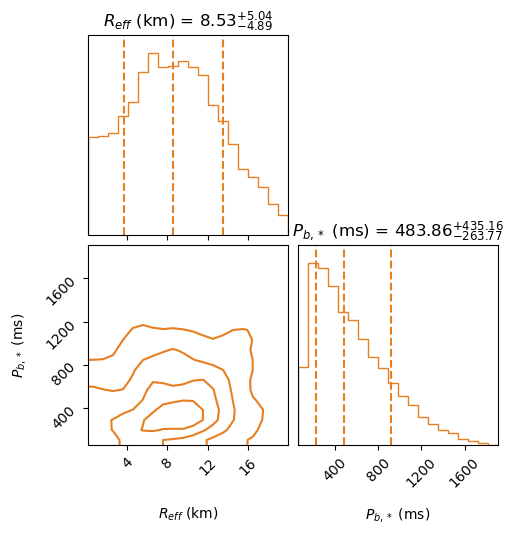

In [3]:
import numpy as np  
    # 以二进制读取模式 (rb) 加载
with open('posterior_Gamma_10param.pkl', 'rb') as f:
    data = pickle.load(f)
        
cols = data["columns"]
samples = data["samples"]
    
    # 动态获取 R_eff 和 Pb_ms 的索引 (这样哪怕换了 8 参、10 参模型，代码也不用改！)
idx_R = cols.index("R_eff")
idx_Pb = cols.index("Pb_ms")
    
    # 完美提取
data_10 = samples[:, [idx_R, idx_Pb]]

import corner
import matplotlib.pyplot as plt
labels = [r"$R_{eff}$ (km)", r"$P_{b,*}$ (ms)"]
# ==========================================
# 玩法一：只画 data_7 的常规 Corner 图 (纯轮廓版)
# ==========================================
fig1 = corner.corner(
    data_10,
    labels=labels,
    color='#E67E22',              
    quantiles=[0.16, 0.5, 0.84],  
    show_titles=True,             
    title_fmt=".2f",
    # === 下面这 4 行是变成“纯轮廓”的魔法 ===
    plot_datapoints=False,  # 关闭最外围的散点
    plot_density=False,     # 关闭二维密度渐变底色
    fill_contours=False,    # 确保轮廓线内部不填充颜色（空心线）
    smooth=1.0,
    alpha=0.7
)
plt.show()

### Gamma分布8参数

载入 47 个有效观测源。

>>> 启动并行 MCMC (200 核心)...
[进度] 2.5% (50/2000) | Acc: 0.30 | ETA: 129.6 min
[进度] 5.0% (100/2000) | Acc: 0.36 | ETA: 127.7 min
[进度] 7.5% (150/2000) | Acc: 0.42 | ETA: 146.4 min
[进度] 10.0% (200/2000) | Acc: 0.47 | ETA: 148.7 min
[进度] 12.5% (250/2000) | Acc: 0.50 | ETA: 147.0 min
[进度] 15.0% (300/2000) | Acc: 0.49 | ETA: 146.3 min
[进度] 17.5% (350/2000) | Acc: 0.47 | ETA: 144.3 min
[进度] 20.0% (400/2000) | Acc: 0.49 | ETA: 143.4 min
[进度] 22.5% (450/2000) | Acc: 0.49 | ETA: 137.5 min
[进度] 25.0% (500/2000) | Acc: 0.48 | ETA: 133.1 min
[进度] 27.5% (550/2000) | Acc: 0.47 | ETA: 127.5 min
[进度] 30.0% (600/2000) | Acc: 0.47 | ETA: 123.3 min
[进度] 32.5% (650/2000) | Acc: 0.48 | ETA: 117.5 min
[进度] 35.0% (700/2000) | Acc: 0.48 | ETA: 114.6 min
[进度] 37.5% (750/2000) | Acc: 0.49 | ETA: 110.6 min
[进度] 40.0% (800/2000) | Acc: 0.48 | ETA: 106.5 min
[进度] 42.5% (850/2000) | Acc: 0.48 | ETA: 102.7 min
[进度] 45.0% (900/2000) | Acc: 0.48 | ETA: 99.0 min
[进度] 47.5% (950/2000) | Acc: 0.47 | ETA: 94.4 

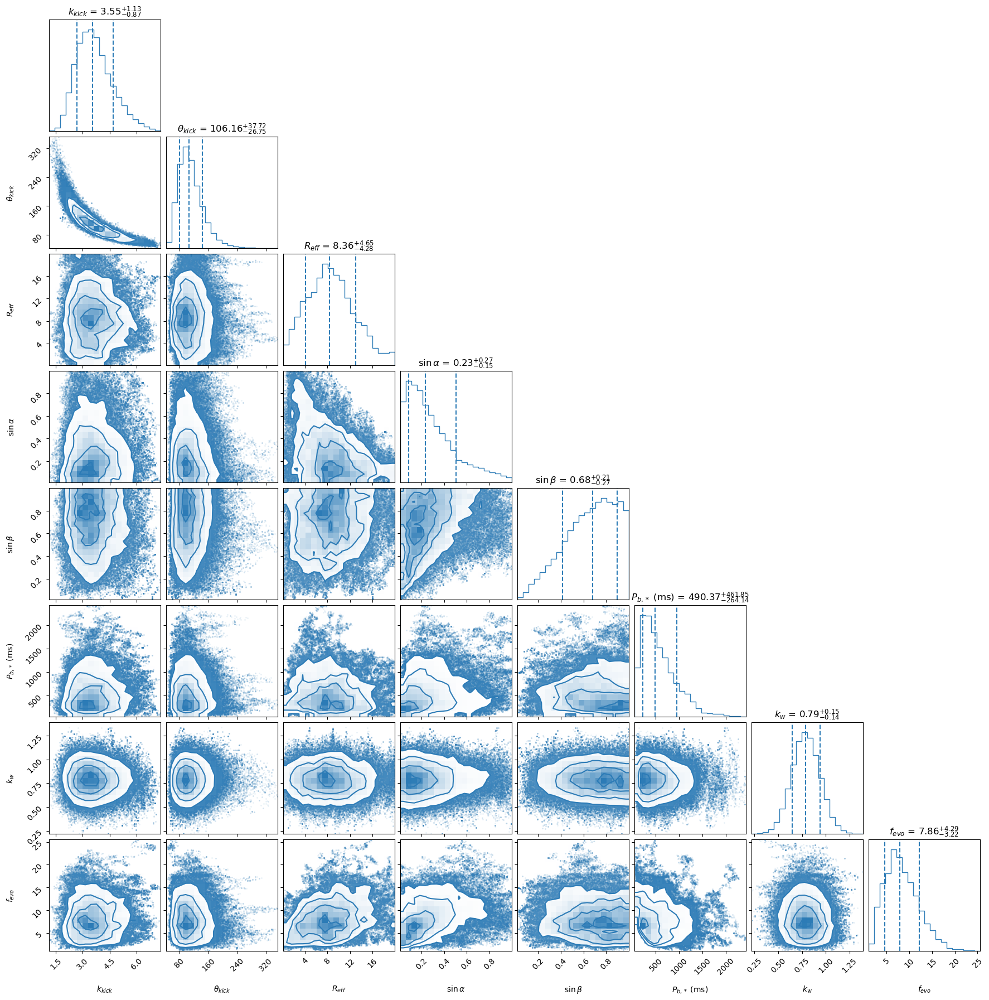

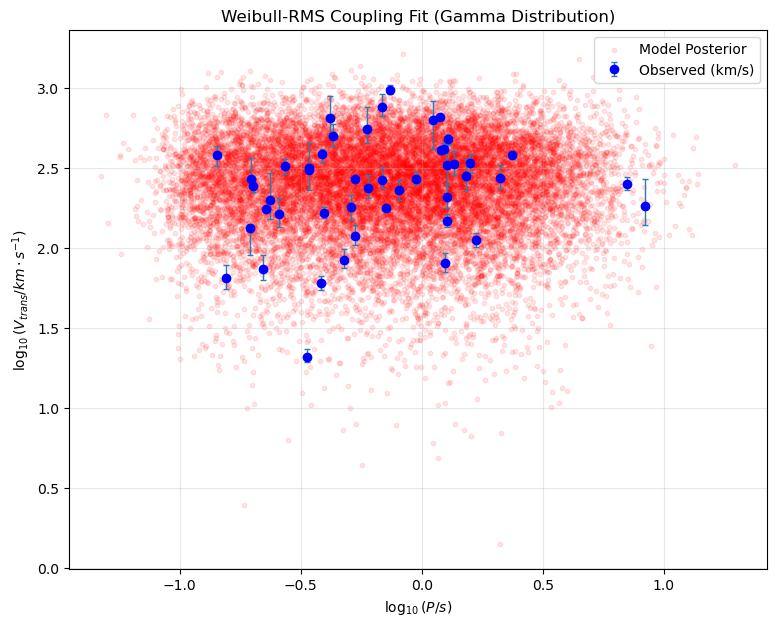

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde, gamma as gamma_dist, weibull_min, norm
from scipy.special import logsumexp, gamma
import time
import multiprocessing as mp 
import sys

# 尝试导入 corner
try:
    import corner
except ImportError:
    corner = None

# ==========================================
# 1. 物理模型：基于角动量 RMS 耦合与 Weibull 演化
# ==========================================
def simulate_full_population(N_sim, theta):
    """
    theta 参数列表 (8个):
    0. k_kick: [修改] Kick速度 Gamma分布的形状参数 k (Shape)
    1. theta_kick: [修改] Kick速度 Gamma分布的尺度参数 theta (Scale)
    2. R_eff_km: 有效半径 (km)
    3. sin_alpha: 几何因子 alpha 的正弦值
    4. sin_beta: 几何因子 beta 的正弦值
    5. P_b_star_ms: 基础自旋周期 P_b,* (单位 ms)
    6. k_weibull: Weibull 分布形状参数 k
    7. f_evo: 周期演化因子 <1/(1-tau)>
    """
    try:
        # [修改] 解包 Gamma 分布参数 k_kick 和 theta_kick
        k_kick, theta_kick, R_eff_km, sin_alpha, sin_beta, P_b_star_ms, k_w, f_evo = theta
    except ValueError:
        return np.array([]), np.array([])

    # 物理常数 (CGS)
    M_ns = 1.4 * 1.989e33  # g
    I_ns = 1e45            # g cm^2
    
    # 将 P_b,* (ms) 转换为 基础角动量 S_b,* (g cm^2/s)
    P_b_s = P_b_star_ms * 1e-3
    S_b_star = (2 * np.pi * I_ns) / P_b_s

    # ----------------------------------------------------
    # 第一步: 模拟 Kick 速度 v_trans (替换为 Gamma 分布)
    # ----------------------------------------------------
    # Gamma 分布均值为 k * theta，生成 3D 速度 (km/s -> cm/s)
    v_3d_kms = gamma_dist.rvs(a=k_kick, scale=theta_kick, size=N_sim) 
    v_3d_cgs = v_3d_kms * 1e5 # cm/s
    
    # 几何投影得到观测的横向速度 v_trans
    u = np.random.uniform(-1, 1, N_sim)
    sin_proj = np.sqrt(1 - u**2)
    v_trans = v_3d_cgs * sin_proj # cm/s

    # ----------------------------------------------------
    # 第二步: 计算角动量 RMS 并推导 P0,rms
    # ----------------------------------------------------
    R_cgs = R_eff_km * 1e5
    # 计算 Delta S (CGS单位)
    delta_S_dist = (M_ns * R_cgs * sin_alpha * v_trans) / (sin_beta + 1e-10)

    # 计算总自旋的均方根 <S0^2> = S_b*^2 + <Delta S^2>
    delta_S_sq_mean = np.mean(delta_S_dist**2)
    S0_rms_val = np.sqrt(S_b_star**2 + delta_S_sq_mean)

    # 将自旋 RMS 转化为周期 RMS
    P0_rms = (2 * np.pi * I_ns) / S0_rms_val

    # ----------------------------------------------------
    # 第三步: 根据 P0,rms 确定 Weibull 参数并抽样
    # ----------------------------------------------------
    gamma_factor = np.sqrt(gamma(1 + 2.0/k_w))
    lambda_w = P0_rms / gamma_factor
    
    # 从 Weibull 分布抽取初始周期 P_birth
    P_birth = weibull_min.rvs(c=k_w, scale=lambda_w, size=N_sim)

    # ----------------------------------------------------
    # 第四步: 周期演化与观测限制
    # ----------------------------------------------------
    P_obs = P_birth * f_evo
    p_detect = 1.0 / (1.0 + np.exp(-(P_obs - 0.1) / 0.01))
    # 蒙特卡洛筛选
    mask = (np.random.rand(len(P_obs)) < p_detect) & (P_obs < 100) & (v_trans > 0)
    # 返回 Log10(P) 和 Log10(V_cgs)
    return np.log10(P_obs[mask]), np.log10(v_trans[mask])

# ==========================================
# 2. 似然函数与先验
# ==========================================
def log_prior(theta):
    if len(theta) != 8: return -np.inf
    # [修改] 解包
    k_kick, theta_kick, R, sa, sb, Pb_ms, k, f = theta 

    # [修改] 设定 Gamma 参数的合理物理范围
    if not (0.5 < k_kick < 10.0): return -np.inf       
    if not (10.0 < theta_kick < 1000.0): return -np.inf 
    
    # 保持原有其他先验不变
    if not (0.1 < R < 20.0): return -np.inf      
    if not (0.01 < sa < 1.0): return -np.inf     
    if not (0.01 < sb < 1.0): return -np.inf     
    if not (10.0 < Pb_ms < 5000.0): return -np.inf 
    if not (0.1 < k < 5.0): return -np.inf       
    if not (1.0 < f < 50.0): return -np.inf      

    return 0.0 

def log_likelihood(theta, obs_data):
    # obs_data 是 (P_cloud, V_cloud) -> V_cloud 是 log10(cm/s)
    lp = log_prior(theta)
    if not np.isfinite(lp): return -np.inf
    
    try:
        sim_logP, sim_logV = simulate_full_population(5000, theta)
    except: return -np.inf
    
    if len(sim_logP) < 50: return -np.inf
    
    try:
        values = np.vstack([sim_logP, sim_logV])
        kernel = gaussian_kde(values, bw_method='scott') 
        
        obs_P_mat, obs_V_mat = obs_data
        n_obs, n_samples = obs_P_mat.shape
        
        check_points = np.vstack([obs_P_mat.ravel(), obs_V_mat.ravel()])
        log_pdf_all = kernel.logpdf(check_points)
        log_pdf_all = np.maximum(log_pdf_all, -100.0)
        
        log_pdf_mat = log_pdf_all.reshape(n_obs, n_samples)
        log_likelihood_per_star = logsumexp(log_pdf_mat, axis=1) - np.log(n_samples)
        
        return np.sum(log_likelihood_per_star) + lp 
    except: return -np.inf

# ==========================================
# 3. 单链 MCMC 运行函数
# ==========================================
def run_single_chain(args):
    seed, start_theta, n_steps, obs_data, is_representative = args
    
    np.random.seed(seed) 
    ndim = len(start_theta)
    
    # 初始微扰
    current_theta = np.array(start_theta) * (1 + np.random.normal(0, 0.01, ndim))
    
    # 确保初始点有效
    current_lp = log_likelihood(current_theta, obs_data)
    if current_lp == -np.inf:
        current_theta = np.array(start_theta)
        current_lp = log_likelihood(current_theta, obs_data)

    chain = []
    accepted = 0
    # [修改] 步长设置: 前两个是 Gamma 的 k 和 theta 步长
    step_scale = np.array([0.1, 10.0, 0.2, 0.02, 0.02, 20.0, 0.05, 0.2]) 
    
    start_time = time.time()
    
    for i in range(n_steps):
        proposal = current_theta + np.random.normal(0, 1, ndim) * step_scale
        proposal_lp = log_likelihood(proposal, obs_data)
        
        if proposal_lp > -np.inf:
            if current_lp == -np.inf: ratio = 1.0
            else: ratio = np.exp(proposal_lp - current_lp)
            
            if np.random.rand() < ratio:
                current_theta = proposal
                current_lp = proposal_lp
                accepted += 1
        
        chain.append(current_theta)
        
        if is_representative and (i + 1) % 50 == 0:
            elapsed = time.time() - start_time
            steps_done = i + 1
            avg_time = elapsed / steps_done
            remain = (n_steps - steps_done) * avg_time
            
            print(f"[进度] {steps_done/n_steps*100:.1f}% ({steps_done}/{n_steps}) | Acc: {accepted/steps_done:.2f} | ETA: {remain/60:.1f} min")
            sys.stdout.flush()
            
    return np.array(chain), accepted / n_steps

# ==========================================
# 4. 主程序
# ==========================================
if __name__ == "__main__":
    # -------------------------------------------------
    # 1. 数据导入
    # -------------------------------------------------
    base_path = '/home/lz/work/pulsar_kick_period/' 
    try:
        raw_velocities = np.loadtxt(base_path + 'vtrans_49_data.txt')
        raw_periods = np.loadtxt(base_path + 'period_49_data.txt')
        raw_v_err_low = np.loadtxt(base_path + 'v_err_low_49_data.txt')
        raw_v_err_up = np.loadtxt(base_path + 'v_err_up_49_data.txt') 
    except Exception as e:
        print(f"数据加载失败: {e}")
        sys.exit(1)

    # 数据清洗
    mask_period = raw_periods > 0.1 
    mask_velocity = (raw_velocities <= 1000.0) & (raw_velocities > 10.0)
    final_mask = mask_period & mask_velocity
    
    clean_periods = raw_periods[final_mask]
    clean_velocities = raw_velocities[final_mask]
    clean_err_low = raw_v_err_low[final_mask]
    clean_err_up = raw_v_err_up[final_mask]
    n_obs = len(clean_periods)

    print(f"载入 {n_obs} 个有效观测源。")

    # -------------------------------------------------
    # 2. 生成非对称误差云
    # -------------------------------------------------
    N_samples_per_obs = 100 
    obs_velocity_samples = np.zeros((n_obs, N_samples_per_obs))

    np.random.seed(42)
    for i in range(n_obs):
        v_mode = clean_velocities[i]
        sig_low = clean_err_low[i]
        sig_up = clean_err_up[i]
        
        z = np.random.normal(0, 1, N_samples_per_obs)
        noise = np.where(z < 0, z * sig_low, z * sig_up)
        
        v_cloud = np.abs(v_mode + noise)
        obs_velocity_samples[i, :] = v_cloud

    obs_logV_cloud = np.log10(obs_velocity_samples * 1e5) 
    obs_logP_cloud = np.tile(np.log10(clean_periods)[:, np.newaxis], (1, N_samples_per_obs))
    obs_data = (obs_logP_cloud, obs_logV_cloud)

    # -------------------------------------------------
    # 3. 并行 MCMC 设置
    # -------------------------------------------------
    n_cores = 200
    try:
        max_cpu = mp.cpu_count()
        if n_cores > max_cpu: n_cores = max_cpu
    except: pass
        
    print(f"\n>>> 启动并行 MCMC ({n_cores} 核心)...")
    
    steps_per_chain = 2000 
    # [修改] 初始猜测 (8参数版本，适用 Gamma 分布)
    # k_kick = 2.0, theta_kick = 150.0
    init_guess = [2.0, 150.0, 10.0, 0.5, 0.5, 400.0, 1.0, 5.0]
    seeds = [1000 + i for i in range(n_cores)]
    
    tasks = []
    for i, seed in enumerate(seeds):
        is_representative = (i == 0)
        tasks.append((seed, init_guess, steps_per_chain, obs_data, is_representative))
    
    start_time = time.time()
    
    results = []
    with mp.Pool(processes=n_cores) as pool:
        iterator = pool.imap_unordered(run_single_chain, tasks)
        for result in iterator:
            results.append(result)

    print(f"\n>>> 计算完成! 耗时: {time.time() - start_time:.1f} s")
    
    # -------------------------------------------------
    # 4. 结果处理与绘图
    # -------------------------------------------------
    all_chains = []
    acc_rates = []
    for chain, acc in results:
        burn_in = int(steps_per_chain * 0.3)
        if len(chain) > burn_in:
            all_chains.append(chain[burn_in:])
        acc_rates.append(acc)

    print(f"平均接受率: {np.mean(acc_rates):.2f}")     
    combined_samples = np.vstack(all_chains)
    best_theta = np.median(combined_samples, axis=0)
    
    # [修改] 更新绘图的标签
    labels = [
        r"$k_{kick}$", r"$\theta_{kick}$", r"$R_{eff}$", 
        r"$\sin\alpha$", r"$\sin\beta$", r"$P_{b,*}$ (ms)", 
        r"$k_{w}$", r"$f_{evo}$"
    ]
    
    print("\n>>> 最佳拟合参数 (Median):")
    for l, v in zip(labels, best_theta):
        print(f"{l}: {v:.4f}")

    if corner:
        fig = corner.corner(combined_samples, labels=labels, 
                            quantiles=[0.16, 0.5, 0.84],
                            color='#2C7BB6',
                            show_titles=True, title_fmt=".2f")
        plt.show()

    # --- 散点对比图 ---
    sim_logP, sim_logV_cgs = simulate_full_population(20000, best_theta)
    sim_logV_kms = sim_logV_cgs - 5.0 
    
    plt.figure(figsize=(9, 7))
    plt.scatter(sim_logP, sim_logV_kms, s=10, color='red', alpha=0.1, label='Model Posterior')
    
    obs_logP_plot = np.log10(clean_periods)
    obs_logV_plot = np.log10(clean_velocities) 
    
    yerr_up = np.log10(clean_velocities + clean_err_up) - obs_logV_plot
    v_low_safe = np.maximum(clean_velocities - clean_err_low, 1.0) 
    yerr_low = obs_logV_plot - np.log10(v_low_safe)
    
    plt.errorbar(obs_logP_plot, obs_logV_plot, yerr=[yerr_low, yerr_up], 
                 fmt='o', color='blue', ecolor='#2C7BB6', elinewidth=1, capsize=2, 
                 label='Observed (km/s)', zorder=10)
    
    plt.xlabel(r'$\log_{10}(P / s)$')
    plt.ylabel(r'$\log_{10}(V_{trans} / km \cdot s^{-1})$') 
    # [修改] 更新散点图的标题
    plt.title("Weibull-RMS Coupling Fit (Gamma Distribution)")
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.show()

In [2]:
import pickle  
    # 把列名和数据矩阵打包成一个字典
save_dict = {
    "model_name": "Gamma_47_8Param",
    "columns": ["k_kick","theta_kick", "R_eff", "sin_alpha", "sin_beta", "Pb_ms", "k_w", "f_evo"],
    "samples": combined_samples
}
    
    # 以二进制写入模式 (wb) 保存
with open('posterior_Gamma_47_8param.pkl', 'wb') as f:
    pickle.dump(save_dict, f)
print(">>> 已保存为 pickle 格式！")

>>> 已保存为 pickle 格式！


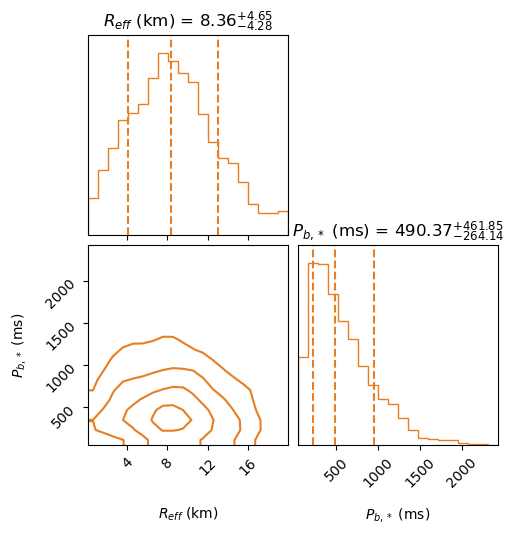

In [3]:
import numpy as np  
    # 以二进制读取模式 (rb) 加载
with open('posterior_Gamma_47_8param.pkl', 'rb') as f:
    data = pickle.load(f)
        
cols = data["columns"]
samples = data["samples"]
    
    # 动态获取 R_eff 和 Pb_ms 的索引 (这样哪怕换了 8 参、10 参模型，代码也不用改！)
idx_R = cols.index("R_eff")
idx_Pb = cols.index("Pb_ms")
    
    # 完美提取
data_10 = samples[:, [idx_R, idx_Pb]]

import corner
import matplotlib.pyplot as plt
labels = [r"$R_{eff}$ (km)", r"$P_{b,*}$ (ms)"]
# ==========================================
# 玩法一：只画 data_7 的常规 Corner 图 (纯轮廓版)
# ==========================================
fig1 = corner.corner(
    data_10,
    labels=labels,
    color='#E67E22',              
    quantiles=[0.16, 0.5, 0.84],  
    show_titles=True,             
    title_fmt=".2f",
    # === 下面这 4 行是变成“纯轮廓”的魔法 ===
    plot_datapoints=False,  # 关闭最外围的散点
    plot_density=False,     # 关闭二维密度渐变底色
    fill_contours=False,    # 确保轮廓线内部不填充颜色（空心线）
    smooth=1.0,
    alpha=0.7
)
plt.show()